In [ ]:
pip install -U sentence-transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 kB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 72.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 66.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 28.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 83.5 MB/s eta 0:00:00
  Created wheel for sentence-transformers: filename=sentence_transformers-2.2.2-py3-none-any.whl size=125942 sha256=ed88b44dc5fa8b1bcba1c4c999cf9a07df07bc9e265d411496a01adf5260e7c7
  Stored in directory: /root/.cache/pip/wheels/62/f2/10/1e606fd5f02395388f74e7462910fe851042f97238cbbd902f
Successfully built sentence-transformers


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
import random
import warnings
warnings.filterwarnings('ignore')
import os
import random
import operator
import requests
from scipy import sparse
import sys
# from surprise import Dataset, Reader
# from surprise import KNNBasic, SVD
# from surprise.model_selection import train_test_split
# from surprise import accuracy
# from surprise.dataset import DatasetAutoFolds
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df_ratings = pd.read_csv('/content/drive/MyDrive/Major_Project_ML/ratings.csv')
df_links = pd.read_csv('/content/drive/MyDrive/Major_Project_ML/links.csv')
df_movies = pd.read_csv('/content/drive/MyDrive/Major_Project_ML/movies.csv')
df_tags = pd.read_csv('/content/drive/MyDrive/Major_Project_ML/tags.csv')

# Preprocessing and Visualization

In [ ]:
df_movies.head()

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy


In [ ]:
df_ratings.head()

,userId,movieId,rating,timestamp
0,1,169,2.5,1204927694
1,1,2471,3.0,1204927438
2,1,48516,5.0,1204927435
3,2,2571,3.5,1436165433
4,2,109487,4.0,1436165496


In [ ]:
df_links.head()

,movieId,imdbId,tmdbId
0,1,114709,862.0
1,2,113497,8844.0
2,3,113228,15602.0
3,4,114885,31357.0
4,5,113041,11862.0


In [ ]:
df_tags.head()

,userId,movieId,tag,timestamp
0,19,2324,bittersweet,1428651158
1,19,2324,holocaust,1428651112
2,19,2324,World War II,1428651118
3,23,7075,hilarious,1378675786
4,23,7075,Underrated,1378675786


In [ ]:
dff_tags = df_tags.copy(deep=True)

In [ ]:
dff_tags['timestamp'] = pd.to_datetime(dff_tags['timestamp'],unit='s') # Converts timestamp into Date and Time format
dff_tags['date'] = dff_tags['timestamp'].dt.date
dff_tags['time'] = dff_tags['timestamp'].dt.time

In [ ]:
dff_tags['year'] = dff_tags['timestamp'].dt.year
dff_tags['month'] = dff_tags['timestamp'].dt.month
dff_tags['date'] = dff_tags['timestamp'].dt.date
dff_tags['hour'] = dff_tags['timestamp'].dt.hour

In [ ]:
dff_tags

,userId,movieId,tag,timestamp,date,time,year,month,hour
0,19,2324,bittersweet,2015-04-10 07:32:38,2015-04-10,07:32:38,2015,4,7
1,19,2324,holocaust,2015-04-10 07:31:52,2015-04-10,07:31:52,2015,4,7
2,19,2324,World War II,2015-04-10 07:31:58,2015-04-10,07:31:58,2015,4,7
3,23,7075,hilarious,2013-09-08 21:29:46,2013-09-08,21:29:46,2013,9,21
4,23,7075,Underrated,2013-09-08 21:29:46,2013-09-08,21:29:46,2013,9,21
...,...,...,...,...,...,...,...,...,...
586989,247751,96655,future,2013-04-15 15:52:06,2013-04-15,15:52:06,2013,4,15
586990,247751,96655,robots,2013-04-15 15:52:08,2013-04-15,15:52:08,2013,4,15
586991,247753,356,classic,2015-05-01 00:06:16,2015-05-01,00:06:16,2015,5,0
586992,247753,356,oscar (best supporting actor),2015-05-01 00:06:16,2015-05-01,00:06:16,2015,5,0


In [ ]:
dff_tags.isnull().sum()

userId        0
movieId       0
tag          16
timestamp     0
date          0
time          0
year          0
month         0
hour          0
dtype: int64

In [ ]:
dff_tags.dropna(inplace=True)

In [ ]:
dff_tags.isnull().sum()

userId       0
movieId      0
tag          0
timestamp    0
date         0
time         0
year         0
month        0
hour         0
dtype: int64

In [ ]:
#Extracted the date , time, year , month, hour
#Now, binning

In [ ]:
years = list(dff_tags['year'].unique())
print(years)

[2015, 2013, 2012, 2006, 2007, 2010, 2011, 2009, 2014, 2008, 2016, 2005]


In [ ]:
len(years)

12

In [ ]:
#Code to find no. of tags for every year
year_count=[]
for i in range(len(years)):
  dp = dff_tags[dff_tags['year']==years[i]]
  year_count.append(len(dp))

yearss = dict(zip(years,year_count))

In [ ]:
yearss

{2015: 129617,
 2013: 61602,
 2012: 55346,
 2006: 34683,
 2007: 33797,
 2010: 57555,
 2011: 64487,
 2009: 69106,
 2014: 50863,
 2008: 20486,
 2016: 9407,
 2005: 29}

In [ ]:
dff_tags['month'].unique()

array([ 4,  9, 12,  6, 10,  3,  1, 11,  2,  5,  8,  7])

In [ ]:
#Code to bin years
bins_years = [2004,2008,2011,2014,2017]
#Bins are such that [2005,2008) , [2008,2011)
labels_years = ['2005-2007','2008-2010','2011-2013','2014-2016']
dff_tags['year_bins'] = pd.cut(dff_tags['year'],bins=bins_years,labels=labels_years)

In [ ]:
dff_tags

,userId,movieId,tag,timestamp,date,time,year,month,hour,year_bins
0,19,2324,bittersweet,2015-04-10 07:32:38,2015-04-10,07:32:38,2015,4,7,2014-2016
1,19,2324,holocaust,2015-04-10 07:31:52,2015-04-10,07:31:52,2015,4,7,2014-2016
2,19,2324,World War II,2015-04-10 07:31:58,2015-04-10,07:31:58,2015,4,7,2014-2016
3,23,7075,hilarious,2013-09-08 21:29:46,2013-09-08,21:29:46,2013,9,21,2011-2013
4,23,7075,Underrated,2013-09-08 21:29:46,2013-09-08,21:29:46,2013,9,21,2011-2013
...,...,...,...,...,...,...,...,...,...,...
586989,247751,96655,future,2013-04-15 15:52:06,2013-04-15,15:52:06,2013,4,15,2011-2013
586990,247751,96655,robots,2013-04-15 15:52:08,2013-04-15,15:52:08,2013,4,15,2011-2013
586991,247753,356,classic,2015-05-01 00:06:16,2015-05-01,00:06:16,2015,5,0,2014-2016
586992,247753,356,oscar (best supporting actor),2015-05-01 00:06:16,2015-05-01,00:06:16,2015,5,0,2014-2016


In [ ]:
#Code to bin months
bins_month = [0,3,6,9,13]
labels_month = ['Jan-Mar','Apr-Jun','Jul-Sep','Oct-Dec']
dff_tags['month_bins'] = pd.cut(dff_tags['month'],bins=bins_month,labels=labels_month)

In [ ]:
dff_tags

,userId,movieId,tag,timestamp,date,time,year,month,hour,year_bins,month_bins
0,19,2324,bittersweet,2015-04-10 07:32:38,2015-04-10,07:32:38,2015,4,7,2014-2016,Apr-Jun
1,19,2324,holocaust,2015-04-10 07:31:52,2015-04-10,07:31:52,2015,4,7,2014-2016,Apr-Jun
2,19,2324,World War II,2015-04-10 07:31:58,2015-04-10,07:31:58,2015,4,7,2014-2016,Apr-Jun
3,23,7075,hilarious,2013-09-08 21:29:46,2013-09-08,21:29:46,2013,9,21,2011-2013,Jul-Sep
4,23,7075,Underrated,2013-09-08 21:29:46,2013-09-08,21:29:46,2013,9,21,2011-2013,Jul-Sep
...,...,...,...,...,...,...,...,...,...,...,...
586989,247751,96655,future,2013-04-15 15:52:06,2013-04-15,15:52:06,2013,4,15,2011-2013,Apr-Jun
586990,247751,96655,robots,2013-04-15 15:52:08,2013-04-15,15:52:08,2013,4,15,2011-2013,Apr-Jun
586991,247753,356,classic,2015-05-01 00:06:16,2015-05-01,00:06:16,2015,5,0,2014-2016,Apr-Jun
586992,247753,356,oscar (best supporting actor),2015-05-01 00:06:16,2015-05-01,00:06:16,2015,5,0,2014-2016,Apr-Jun


In [ ]:
#Code to bin hours
bins_hour = [-1,4,8,12,16,20,24]
labels_hour = ['00:00-03:59','4:00-7:59','8:00-11:59','12:00-15:59','16:00-19:59','20:00-23:59']
dff_tags['hour_bins'] = pd.cut(dff_tags['hour'],bins=bins_hour,labels=labels_hour)

In [ ]:
dff_tags

,userId,movieId,tag,timestamp,date,time,year,month,hour,year_bins,month_bins,hour_bins
0,19,2324,bittersweet,2015-04-10 07:32:38,2015-04-10,07:32:38,2015,4,7,2014-2016,Apr-Jun,4:00-7:59
1,19,2324,holocaust,2015-04-10 07:31:52,2015-04-10,07:31:52,2015,4,7,2014-2016,Apr-Jun,4:00-7:59
2,19,2324,World War II,2015-04-10 07:31:58,2015-04-10,07:31:58,2015,4,7,2014-2016,Apr-Jun,4:00-7:59
3,23,7075,hilarious,2013-09-08 21:29:46,2013-09-08,21:29:46,2013,9,21,2011-2013,Jul-Sep,20:00-23:59
4,23,7075,Underrated,2013-09-08 21:29:46,2013-09-08,21:29:46,2013,9,21,2011-2013,Jul-Sep,20:00-23:59
...,...,...,...,...,...,...,...,...,...,...,...,...
586989,247751,96655,future,2013-04-15 15:52:06,2013-04-15,15:52:06,2013,4,15,2011-2013,Apr-Jun,12:00-15:59
586990,247751,96655,robots,2013-04-15 15:52:08,2013-04-15,15:52:08,2013,4,15,2011-2013,Apr-Jun,12:00-15:59
586991,247753,356,classic,2015-05-01 00:06:16,2015-05-01,00:06:16,2015,5,0,2014-2016,Apr-Jun,00:00-03:59
586992,247753,356,oscar (best supporting actor),2015-05-01 00:06:16,2015-05-01,00:06:16,2015,5,0,2014-2016,Apr-Jun,00:00-03:59


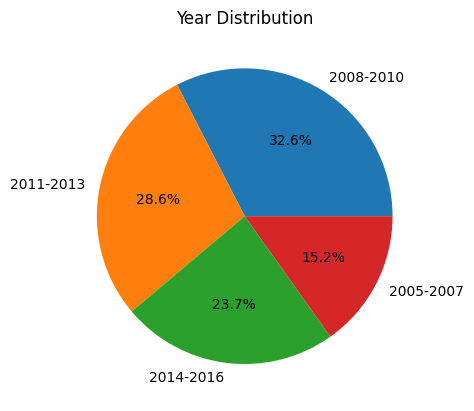

In [ ]:
#Pie plot between no. of tags and Year bins

year_counts = dff_tags['year_bins'].value_counts()
plt.pie(year_counts,labels=year_counts.index,autopct='%1.1f%%')
plt.title('Year Distribution')
plt.show()

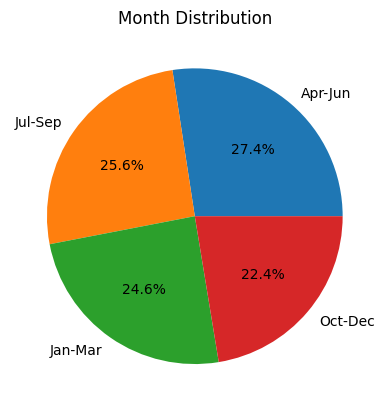

In [ ]:
#Pie plot between no. of tags and Month bins

month_counts = dff_tags['month_bins'].value_counts()
plt.pie(month_counts,labels=month_counts.index,autopct='%1.1f%%')
plt.title('Month Distribution')
plt.show()

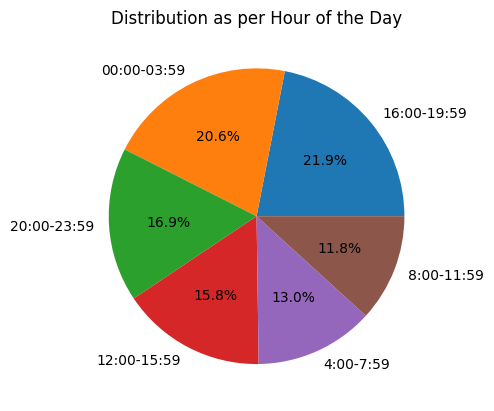

In [ ]:
#Pie plot between no. of tags and Hour bins

hour_counts = dff_tags['hour_bins'].value_counts()
plt.pie(hour_counts,labels=hour_counts.index,autopct='%1.1f%%')
plt.title('Distribution as per Hour of the Day')
plt.show()

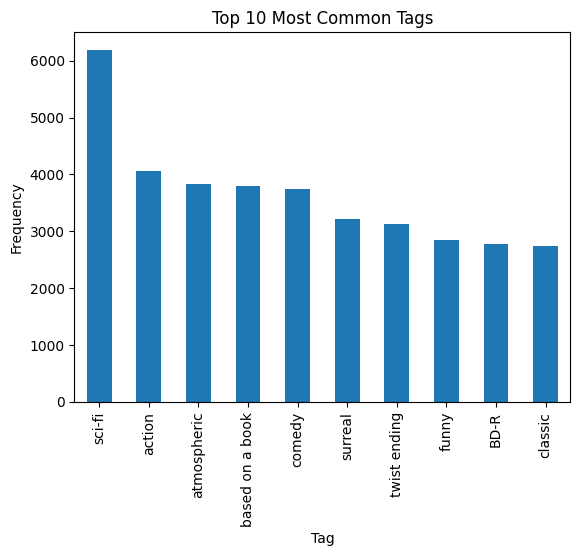

In [ ]:
# Create a bar chart of the tag frequency
tag_freq = dff_tags['tag'].value_counts()
tag_freq[:10].plot(kind='bar')
plt.xlabel('Tag')
plt.ylabel('Frequency')
plt.title('Top 10 Most Common Tags')
plt.show()

In [ ]:
#Now we will append Movie names as per their titles in dff_tags

In [ ]:
dff_tags = pd.merge(dff_tags, df_movies[['movieId', 'title']], on='movieId', how='left')

In [ ]:
dff_tags

,userId,movieId,tag,timestamp,date,time,year,month,hour,year_bins,month_bins,hour_bins,title
0,19,2324,bittersweet,2015-04-10 07:32:38,2015-04-10,07:32:38,2015,4,7,2014-2016,Apr-Jun,4:00-7:59,Life Is Beautiful (La Vita è bella) (1997)
1,19,2324,holocaust,2015-04-10 07:31:52,2015-04-10,07:31:52,2015,4,7,2014-2016,Apr-Jun,4:00-7:59,Life Is Beautiful (La Vita è bella) (1997)
2,19,2324,World War II,2015-04-10 07:31:58,2015-04-10,07:31:58,2015,4,7,2014-2016,Apr-Jun,4:00-7:59,Life Is Beautiful (La Vita è bella) (1997)
3,23,7075,hilarious,2013-09-08 21:29:46,2013-09-08,21:29:46,2013,9,21,2011-2013,Jul-Sep,20:00-23:59,"Court Jester, The (1956)"
4,23,7075,Underrated,2013-09-08 21:29:46,2013-09-08,21:29:46,2013,9,21,2011-2013,Jul-Sep,20:00-23:59,"Court Jester, The (1956)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
586973,247751,96655,future,2013-04-15 15:52:06,2013-04-15,15:52:06,2013,4,15,2011-2013,Apr-Jun,12:00-15:59,Robot & Frank (2012)
586974,247751,96655,robots,2013-04-15 15:52:08,2013-04-15,15:52:08,2013,4,15,2011-2013,Apr-Jun,12:00-15:59,Robot & Frank (2012)
586975,247753,356,classic,2015-05-01 00:06:16,2015-05-01,00:06:16,2015,5,0,2014-2016,Apr-Jun,00:00-03:59,Forrest Gump (1994)
586976,247753,356,oscar (best supporting actor),2015-05-01 00:06:16,2015-05-01,00:06:16,2015,5,0,2014-2016,Apr-Jun,00:00-03:59,Forrest Gump (1994)


In [ ]:
dff_tags["year_bins"].value_counts()

2008-2010    191148
2011-2013    167811
2014-2016    139024
2005-2007     88995
Name: year_bins, dtype: int64

In [ ]:
movieid_years = dff_tags.copy(deep=True)
userid_years = dff_tags.copy(deep=True)

In [ ]:
#Code to drop following columns from dataset
movieid_years.drop(['userId','timestamp','date','time','year','month','hour','month_bins','hour_bins','title'],axis=1,inplace=True)
userid_years.drop(['movieId','timestamp','date','time','year','month','hour','month_bins','hour_bins','title'],axis=1,inplace=True)

In [ ]:
movieid_years

,movieId,tag,year_bins
0,2324,bittersweet,2014-2016
1,2324,holocaust,2014-2016
2,2324,World War II,2014-2016
3,7075,hilarious,2011-2013
4,7075,Underrated,2011-2013
...,...,...,...
586973,96655,future,2011-2013
586974,96655,robots,2011-2013
586975,356,classic,2014-2016
586976,356,oscar (best supporting actor),2014-2016


In [ ]:
userid_years

,userId,tag,year_bins
0,19,bittersweet,2014-2016
1,19,holocaust,2014-2016
2,19,World War II,2014-2016
3,23,hilarious,2011-2013
4,23,Underrated,2011-2013
...,...,...,...
586973,247751,future,2011-2013
586974,247751,robots,2011-2013
586975,247753,classic,2014-2016
586976,247753,oscar (best supporting actor),2014-2016


In [ ]:
movieid_years

,movieId,tag,year_bins
0,2324,bittersweet,2014-2016
1,2324,holocaust,2014-2016
2,2324,World War II,2014-2016
3,7075,hilarious,2011-2013
4,7075,Underrated,2011-2013
...,...,...,...
586973,96655,future,2011-2013
586974,96655,robots,2011-2013
586975,356,classic,2014-2016
586976,356,oscar (best supporting actor),2014-2016


In [ ]:
df_movies

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy
...,...,...,...
34203,151697,Grand Slam (1967),Thriller
34204,151701,Bloodmoney (2010),(no genres listed)
34205,151703,The Butterfly Circus (2009),Drama
34206,151709,Zero (2015),Drama|Sci-Fi


In [ ]:
#Code to find following unique values

df_movies_columns = list(df_movies.columns)
for i in range(len(df_movies_columns)):
  print("Unique values in",df_movies_columns[i],len(dict(df_movies[df_movies_columns[i]].value_counts())))

Unique values in movieId 34208
Unique values in title 34185
Unique values in genres 1446


In [ ]:
df_movies.isnull().sum()

movieId    0
title      0
genres     0
dtype: int64

In [ ]:
# Code to print duplicates in df_movies dataset

all_movies_count = dict(df_movies["title"].value_counts())
# print(all_movies_count)
print("Movies with 2 occurrence in dataset-")
for i in all_movies_count:
  if(all_movies_count[i]>1):
    print(i,"with tags-")
    print(df_movies[df_movies["title"]==i])
    print()

Movies with 2 occurrence in dataset-
Darling (2007) with tags-
       movieId           title genres
18778    93279  Darling (2007)  Drama
28105   130062  Darling (2007)  Drama

Men with Guns (1997) with tags-
      movieId                 title        genres
1716     1788  Men with Guns (1997)  Action|Drama
9154    26982  Men with Guns (1997)         Drama

The Dream Team (2012) with tags-
       movieId                  title                genres
30645   138868  The Dream Team (2012)  Comedy|Drama|Romance
30646   138870  The Dream Team (2012)           Documentary

Clear History (2013) with tags-
       movieId                 title  genres
21547   104155  Clear History (2013)  Comedy
26481   122940  Clear History (2013)  Comedy

Clockstoppers (2002) with tags-
       movieId                 title                              genres
5168      5264  Clockstoppers (2002)    Action|Adventure|Sci-Fi|Thriller
32351   144426  Clockstoppers (2002)  Adventure|Children|Sci-Fi|Thriller

Girl,

In [ ]:
# Code to split genres over '|'

new_dataset = dict()
for i in range(len(df_movies)):
  if(df_movies["title"].iloc[i] in new_dataset.keys()):
    new_dataset[df_movies["title"].iloc[i]]= (new_dataset[df_movies["title"].iloc[i]] + "|" +str(df_movies["genres"].iloc[i]))
  else:
    new_dataset[df_movies["title"].iloc[i]]=str(df_movies["genres"].iloc[i])
for i in new_dataset:
  temp = new_dataset[i].split("|")
  new_dataset[i] = list(set(temp))

In [ ]:
#Code to create a list of genres for each movie

all_generes_splited = []
for i in range(len(df_movies)):
  all_generes_splited.append(new_dataset[df_movies["title"].iloc[i]])

In [ ]:
df_movies["genres_list"] = all_generes_splited
df_movies

,movieId,title,genres,genres_list
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,"[Children, Adventure, Animation, Comedy, Fantasy]"
1,2,Jumanji (1995),Adventure|Children|Fantasy,"[Children, Adventure, Fantasy]"
2,3,Grumpier Old Men (1995),Comedy|Romance,"[Romance, Comedy]"
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance,"[Drama, Romance, Comedy]"
4,5,Father of the Bride Part II (1995),Comedy,[Comedy]
...,...,...,...,...
34203,151697,Grand Slam (1967),Thriller,[Thriller]
34204,151701,Bloodmoney (2010),(no genres listed),[(no genres listed)]
34205,151703,The Butterfly Circus (2009),Drama,[Drama]
34206,151709,Zero (2015),Drama|Sci-Fi,"[Sci-Fi, Drama]"


In [ ]:
#Code to calculate no. of movies containing given genres

all_generes = dict()
for i in range(len(df_movies)):
  temp_list = list(df_movies["genres_list"].iloc[i])
  for j in range(len(temp_list)):
    if(temp_list[j] in list(all_generes.keys())):
      all_generes[temp_list[j]] += 1
    else:
      all_generes[temp_list[j]] = 1


In [ ]:
all_generes

{'Children': 1610,
 'Adventure': 2766,
 'Animation': 1387,
 'Comedy': 10128,
 'Fantasy': 1693,
 'Romance': 4880,
 'Drama': 15780,
 'Thriller': 5305,
 'Action': 4451,
 'Crime': 3447,
 'Horror': 3367,
 'Mystery': 1837,
 'Sci-Fi': 2156,
 'IMAX': 196,
 'Documentary': 3041,
 'War': 1345,
 'Musical': 1053,
 'Western': 779,
 'Film-Noir': 338,
 '(no genres listed)': 1145}

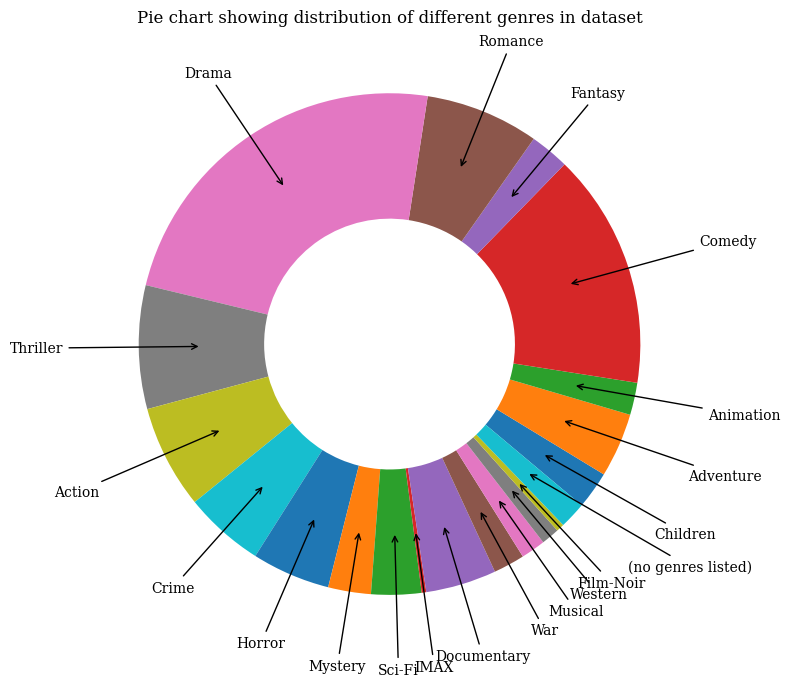

In [ ]:
#Code to plot donut chart showing distribution of genres in the dataset

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.font_manager
plt.rcdefaults()
plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']
labels = all_generes.keys()
sizes = all_generes.values()

fig, ax = plt.subplots(figsize=(8, 12), subplot_kw=dict(aspect="equal"))

wedges, texts = ax.pie(sizes, wedgeprops=dict(width=0.5), startangle=-40)

kw = dict(arrowprops=dict(arrowstyle="->"), va="center")
for p, label in zip(wedges, labels):
    ang = np.deg2rad((p.theta1 + p.theta2)/2)
    y = np.sin(ang)
    x = np.cos(ang)
    horizontalalignment = "center" if abs(x) < abs(y) else "right" if x < 0 else "left"
    ax.annotate(label, xy=(0.75*x, 0.75*y), xytext=(1.3*x, 1.3*y),
                horizontalalignment=horizontalalignment, **kw)
plt.tight_layout()
plt.title("Pie chart showing distribution of different genres in dataset")
plt.show()

In [ ]:
#Code to store genres for all movies

all_generes_list = list(all_generes.keys())
all_geners_list_for_all_rows = []
for i in range(len(df_movies)):
  temp_list = list(np.zeros(len(all_generes_list),dtype=int))
  for j in range(len(df_movies["genres_list"].iloc[i])):
    temp_list[all_generes_list.index(list(df_movies["genres_list"].iloc[i])[j])] = int(1)
  all_geners_list_for_all_rows.append(temp_list)

In [ ]:
all_geners_split_dataframe = pd.DataFrame(all_geners_list_for_all_rows,columns=all_generes_list)

In [ ]:
#Creates new dataframe that contains movies with their genres

df_movies_new = pd.concat([df_movies,all_geners_split_dataframe],axis=1)
df_movies_new.drop(["genres"],axis=1,inplace=True)
df_movies_new

,movieId,title,genres_list,Children,Adventure,Animation,Comedy,Fantasy,Romance,Drama,...,Horror,Mystery,Sci-Fi,IMAX,Documentary,War,Musical,Western,Film-Noir,(no genres listed)
0,1,Toy Story (1995),"[Children, Adventure, Animation, Comedy, Fantasy]",1,1,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,Jumanji (1995),"[Children, Adventure, Fantasy]",1,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,3,Grumpier Old Men (1995),"[Romance, Comedy]",0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,4,Waiting to Exhale (1995),"[Drama, Romance, Comedy]",0,0,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
4,5,Father of the Bride Part II (1995),[Comedy],0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34203,151697,Grand Slam (1967),[Thriller],0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
34204,151701,Bloodmoney (2010),[(no genres listed)],0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
34205,151703,The Butterfly Circus (2009),[Drama],0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
34206,151709,Zero (2015),"[Sci-Fi, Drama]",0,0,0,0,0,0,1,...,0,0,1,0,0,0,0,0,0,0


In [ ]:
import matplotlib.pyplot as plt
df_movies_new["movieId"].value_counts()

1         1
108639    1
108694    1
108692    1
108689    1
         ..
48678     1
48673     1
48660     1
48649     1
151711    1
Name: movieId, Length: 34208, dtype: int64

In [ ]:
copy_ratings = df_ratings.copy(deep = True)
copy_movies = df_movies.copy(deep = True)
copy_links = df_links.copy(deep = True)
copy_tags = df_tags.copy(deep = True)


In [ ]:
#Code to store ratings for each movie

movie_rating = {}
id_list = copy_ratings['movieId'].to_numpy()
ratings_list = copy_ratings['rating'].to_numpy()

for i in range(0,len(copy_ratings),1):
  if id_list[i] in movie_rating.keys():
    movie_rating[id_list[i]].append(ratings_list[i])
  else:
    movie_rating[id_list[i]] = []
    movie_rating[id_list[i]].append(ratings_list[i])

In [ ]:
key_list = list(movie_rating.keys())
key_list.sort()
print(type(key_list))
print(key_list)

<class 'list'>
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 2

In [ ]:
#Code to find IDs of movies without ratings

link_id = copy_links['movieId'].to_numpy()

missing_id = []

for i in link_id:
  if i not in key_list:
    missing_id.append(i)
print(missing_id)

[25981, 26018, 26580, 27396, 31797, 33229, 63280, 65078, 66622, 69565, 69864, 70372, 72681, 72908, 77451, 78713, 79363, 80226, 80592, 80827, 86314, 87266, 87466, 88471, 88833, 89100, 89482, 89831, 90035, 90116, 90493, 92268, 92516, 92845, 92847, 92925, 94435, 94725, 94808, 96086, 96176, 96275, 96598, 98389, 98398, 98452, 98583, 99020, 99717, 100463, 100577, 101216, 101224, 101237, 101407, 101472, 102417, 103472, 104026, 104095, 105111, 105279, 105542, 105792, 105796, 105961, 106028, 106483, 106521, 106859, 107226, 107289, 108046, 108125, 108816, 108844, 108846, 109231, 109287, 109319, 109357, 109647, 110108, 110155, 110354, 110368, 110370, 110399, 110493, 110531, 110539, 110696, 110820, 110916, 111318, 111358, 111667, 111842, 111997, 112023, 112116, 112271, 112353, 112419, 112432, 112477, 112510, 112546, 112648, 112751, 112840, 112880, 113107, 113145, 113230, 113236, 113290, 113323, 113614, 113670, 113686, 113755, 113872, 113949, 114095, 114219, 114685, 114687, 114799, 114805, 114893, 

In [ ]:
for i in range(0,len(missing_id),1):
  movie_rating[missing_id[i]] = []
  movie_rating[missing_id[i]].append(0.1)

In [ ]:
final_key_list = list(movie_rating.keys())
final_key_list.sort()
print(final_key_list)
print(len(final_key_list))

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 222, 223, 2

In [ ]:
movie_rating_df = pd.DataFrame()

movie_rating_df['movieId'] = final_key_list
movie_rating_df

,movieId
0,1
1,2
2,3
3,4
4,5
...,...
34203,151697
34204,151701
34205,151703
34206,151709


In [ ]:
print(np.mean(movie_rating[key_list[1]]))

3.2210855949895616


In [ ]:
#Code to find average rating for each movie

mean_list = []

for i in range(0,len(final_key_list),1):
  temp_mean = round(np.mean(movie_rating[final_key_list[i]]),3)
  mean_list.append(temp_mean)


In [ ]:
movie_rating_df['avg_rating'] = mean_list
movie_rating_df

,movieId,avg_rating
0,1,3.895
1,2,3.221
2,3,3.180
3,4,2.880
4,5,3.081
...,...,...
34203,151697,3.000
34204,151701,4.000
34205,151703,5.000
34206,151709,3.500


In [ ]:
#Code to find no. of ratings per movie

number_list = []

for i in range(0,len(final_key_list),1):
  number_list.append(len(movie_rating[final_key_list[i]]))

movie_rating_df['Rating_no'] = number_list
movie_rating_df

,movieId,avg_rating,Rating_no
0,1,3.895,60424
1,2,3.221,23950
2,3,3.180,15267
3,4,2.880,2935
4,5,3.081,14769
...,...,...,...
34203,151697,3.000,1
34204,151701,4.000,1
34205,151703,5.000,1
34206,151709,3.500,1


In [ ]:
m = np.percentile(number_list,90,axis = 0)
m

1006.2999999999993

In [ ]:
#Code to find weighted ratings for each movie using IMBd's formula for weighted ratings

movie_weight_rating = []
movie_mean = np.mean(mean_list)
m=1000
for i in range(0,len(final_key_list),1):
  num = number_list[i]*mean_list[i] + m*movie_mean
  den = number_list[i] + m
  temp = round(num/den,3)
  movie_weight_rating.append(temp)

In [ ]:
movie_rating_df['Weighted rating'] = movie_weight_rating
movie_rating_df

,movieId,avg_rating,Rating_no,Weighted rating
0,1,3.895,60424,3.881
1,2,3.221,23950,3.214
2,3,3.180,15267,3.172
3,4,2.880,2935,2.924
4,5,3.081,14769,3.079
...,...,...,...,...
34203,151697,3.000,1,3.052
34204,151701,4.000,1,3.053
34205,151703,5.000,1,3.054
34206,151709,3.500,1,3.052


In [ ]:
#Code to store ratings given by every user

user_rating = {}
userid_list = copy_ratings['userId'].to_numpy()
ratings_list = copy_ratings['rating'].to_numpy()

for i in range(0,len(copy_ratings),1):
  if userid_list[i] in user_rating.keys():
    user_rating[userid_list[i]].append(ratings_list[i])
  else:
    user_rating[userid_list[i]] = []
    user_rating[userid_list[i]].append(ratings_list[i])

In [ ]:
user_key_list = list(user_rating.keys())
user_key_list.sort()
print(type(user_key_list))
print(user_key_list)

<class 'list'>
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 21

In [ ]:
#Code to store average ratings for each person and no. of ratings given by him

user_rating_df = pd.DataFrame()

user_rating_df['userId'] = user_key_list

mean_list_2 = []
number_list_2 = []

for i in range(0,len(user_key_list),1):
  temp_mean = round(np.mean(user_rating[user_key_list[i]]),3)
  mean_list_2.append(temp_mean)
  number_list_2.append(len(user_rating[user_key_list[i]]))

user_rating_df['avg_rating'] = mean_list_2
user_rating_df['Rating_no'] = number_list_2

user_rating_df

,userId,avg_rating,Rating_no
0,1,3.500,3
1,2,4.125,4
2,3,4.250,4
3,4,3.730,183
4,5,3.460,25
...,...,...,...
247748,247749,3.600,5
247749,247750,3.800,70
247750,247751,4.211,190
247751,247752,2.727,33


In [ ]:
m = np.percentile(number_list_2,90,axis = 0)
m

227.0

In [ ]:
#Code to find weighted ratings for every user

user_weight_rating = []
user_mean = np.mean(mean_list_2)
m = 227
for i in range(0,len(number_list_2),1):
  num = number_list_2[i]*mean_list_2[i] + m*user_mean
  den = number_list_2[i] + m
  temp = round(num/den,3)
  user_weight_rating.append(temp)

In [ ]:
user_rating_df['Weighted rating'] = user_weight_rating
user_rating_df

,userId,avg_rating,Rating_no,Weighted rating
0,1,3.500,3,3.590
1,2,4.125,4,3.600
2,3,4.250,4,3.602
3,4,3.730,183,3.653
4,5,3.460,25,3.578
...,...,...,...,...
247748,247749,3.600,5,3.591
247749,247750,3.800,70,3.640
247750,247751,4.211,190,3.874
247751,247752,2.727,33,3.481


In [ ]:
#Code to store tags for each movie

movie_tags = {}
tag_list = copy_tags['tag'].to_numpy()
tag_movie_id = copy_tags['movieId'].to_numpy()

for i in range(0,len(copy_tags),1):
  if tag_movie_id[i] in movie_tags.keys():
    movie_tags[tag_movie_id[i]].append(tag_list[i])
  else:
    movie_tags[tag_movie_id[i]] = []
    movie_tags[tag_movie_id[i]].append(tag_list[i])

tag_keys = list(movie_tags.keys())

In [ ]:
#Code to remove duplicate tags

for i in range(0,len(tag_keys),1):
  movie_tags[tag_keys[i]] = list(set(movie_tags[tag_keys[i]]))

In [ ]:
#Code to calculate no. of tags for each movie and sort dictionary according to movieId

tag_keys.sort()
len_list = []
tags_for_movie = []

for i in range(0,len(tag_keys),1):
  len_list.append(len(movie_tags[tag_keys[i]]))
  tags_for_movie.append(movie_tags[tag_keys[i]])

print(len_list)

[110, 41, 15, 5, 18, 88, 23, 8, 6, 52, 30, 7, 10, 21, 14, 66, 48, 31, 26, 9, 29, 14, 9, 14, 51, 12, 20, 27, 46, 3, 34, 114, 2, 46, 23, 51, 3, 9, 59, 9, 12, 3, 6, 28, 13, 7, 141, 43, 8, 141, 9, 3, 4, 2, 8, 17, 2, 5, 3, 30, 4, 2, 11, 3, 3, 6, 14, 66, 1, 22, 11, 6, 2, 11, 5, 5, 4, 16, 18, 18, 7, 13, 11, 4, 9, 18, 5, 4, 15, 17, 3, 45, 3, 6, 37, 3, 1, 30, 28, 17, 137, 99, 17, 6, 8, 20, 8, 1, 17, 4, 56, 1, 12, 3, 2, 2, 9, 2, 2, 17, 3, 2, 5, 31, 4, 24, 4, 40, 3, 14, 81, 26, 11, 50, 31, 2, 14, 4, 21, 1, 15, 26, 22, 35, 16, 40, 9, 1, 12, 4, 39, 7, 35, 33, 4, 30, 13, 5, 7, 1, 34, 8, 4, 5, 3, 31, 32, 13, 10, 2, 9, 5, 37, 18, 17, 1, 45, 36, 7, 9, 18, 7, 2, 1, 6, 40, 1, 2, 1, 8, 12, 74, 20, 1, 14, 7, 3, 15, 67, 15, 12, 2, 1, 6, 17, 46, 48, 21, 7, 48, 21, 12, 17, 2, 3, 10, 3, 1, 3, 28, 45, 3, 21, 3, 2, 16, 68, 20, 13, 10, 3, 995, 37, 20, 10, 2, 18, 27, 11, 1, 2, 2, 4, 19, 11, 2, 7, 21, 23, 3, 16, 10, 21, 1, 7, 60, 9, 22, 1, 22, 118, 505, 2, 32, 34, 4, 23, 18, 7, 36, 47, 26, 3, 6, 5, 17, 11, 53, 26, 

In [ ]:
movie_tags_df = pd.DataFrame()

movie_tags_df['movieId'] = tag_keys
movie_tags_df['tags'] = tags_for_movie
movie_tags_df['Tag no.'] = len_list

movie_tags_df

,movieId,tags,Tag no.
0,1,"[unlikely friendships, HEROIC MISSION, Cartoon...",110
1,2,"[Dynamic CGI Action, fantasy, Saturn Award (Be...",41
2,3,"[comedinha de velhinhos engraÃ§ada, old, NO_FA...",15
3,4,"[revenge, girl movie, characters, chick flick,...",5
4,5,"[family, it thought it was funny but it wasn't...",18
...,...,...,...
21649,151567,"[aliens, space travel, Venus, war, hostile ali...",5
21650,151599,"[Documentary, crowd funding, inspirational]",3
21651,151621,"[Western Australia, Couple relations, Family r...",6
21652,151677,"[trippy, Yogi, nudity, music, spirituality, dr...",8


In [ ]:
#Code to find tags given by each user

user_tags = {}
tag_list = copy_tags['tag'].to_numpy()
tag_user_id = copy_tags['userId'].to_numpy()

for i in range(0,len(copy_tags),1):
  if tag_user_id[i] in user_tags.keys():
    user_tags[tag_user_id[i]].append(tag_list[i])
  else:
    user_tags[tag_user_id[i]] = []
    user_tags[tag_user_id[i]].append(tag_list[i])

user_tag_keys = list(user_tags.keys())
user_tag_keys.sort()

In [ ]:
for i in range(0,len(user_tag_keys),1):
  user_tags[user_tag_keys[i]] = list(set(user_tags[user_tag_keys[i]]))

In [ ]:
#Code to calculate no. of tags for each user and sort dictionary according to userId

len_list_user = []
tags_for_user = []

for i in range(0,len(user_tag_keys),1):
  len_list_user.append(len(user_tags[user_tag_keys[i]]))
  tags_for_user.append(user_tags[user_tag_keys[i]])

print(len_list_user)

[3, 2, 1, 1, 1, 17, 5, 3, 16, 10, 2, 3, 13, 2, 55, 1, 3, 2, 1, 2, 5, 18, 1, 84, 4, 5, 2, 37, 2, 17, 1, 6, 1, 2, 10, 6, 16, 1, 4, 2, 2, 29, 5, 1, 5, 9, 1, 1, 3, 2, 6, 2, 10, 5, 2, 2, 1, 1, 2, 3, 4, 20, 1, 6, 1, 10, 103, 4, 7, 18, 3, 1, 12, 3, 3, 2, 3, 2, 2, 9, 34, 10, 14, 5, 6, 2, 1, 2, 35, 4, 39, 56, 3, 6, 4, 2, 2, 2, 2, 2, 47, 2, 6, 1, 12, 8, 3, 2, 46, 3, 18, 3, 4, 1, 2, 1, 1, 2, 3, 6, 1, 2, 71, 2, 2, 13, 1, 31, 2, 3, 2, 19, 10, 29, 9, 1, 5, 2, 1, 1, 1, 29, 2, 12, 1, 3, 7, 3, 1, 3, 5, 3, 3, 1, 1, 134, 4, 2, 22, 2, 22, 1, 6, 24, 2, 15, 2, 1, 5, 11, 4, 5, 2, 2, 9, 3, 67, 4, 12, 2, 55, 1, 2, 1, 16, 3, 5, 14, 1, 16, 1, 3, 3, 6, 5, 3, 2, 36, 1, 6, 14, 1, 65, 479, 4, 1, 6, 3, 1, 3, 2, 2, 2, 3, 1, 2, 2, 1, 6, 9, 10, 3, 2, 3, 1, 2, 13, 2, 1, 1, 2, 2, 1, 3, 2, 4, 1, 1, 6, 3, 1, 159, 135, 1, 3, 2, 6, 6, 2, 17, 110, 3, 4, 3, 10, 1, 59, 3, 3, 2, 1, 2, 5, 3, 3, 19, 6, 2, 2, 3, 2, 15, 2, 25, 3, 15, 3, 12, 2, 16, 2, 2, 4, 14, 2, 115, 73, 1, 5, 4, 1, 13, 8, 12, 1, 3, 2, 12, 4, 3, 2, 305, 2, 1, 4, 3, 

In [ ]:
user_tags_df = pd.DataFrame()

user_tags_df['userId'] = user_tag_keys
user_tags_df['tags'] = tags_for_user
user_tags_df['Tag no.'] = len_list_user

user_tags_df

,userId,tags,Tag no.
0,19,"[bittersweet, World War II, holocaust]",3
1,23,"[Underrated, hilarious]",2
2,54,[Garath],1
3,57,[Science Fiction],1
4,120,[cinematography],1
...,...,...,...
15352,247700,"[lavish, black comedy, movie to see, action pa...",539
15353,247716,"[space action, sci-fi]",2
15354,247736,"[comedy, Great Screenplays, autism, intelligen...",24
15355,247751,"[robots, future]",2


In [ ]:
l = len(movie_rating_df.columns)-1


train_df = movie_rating_df.sample(frac = 0.65)
test_df = movie_rating_df.drop(train_df.index)

movie_train_x,movie_train_y = train_df.iloc[:,:l],train_df.iloc[:,l]
movie_test_x,movie_test_y = test_df.iloc[:,:l],test_df.iloc[:,l]

In [ ]:
from xgboost import XGBRegressor
from sklearn.metrics import accuracy_score as acc
from sklearn.metrics import mean_squared_error as mse

model_xgb = XGBRegressor()

model_xgb.fit(movie_train_x,movie_train_y)

pred_y = model_xgb.predict(movie_test_x)

err = mse(movie_test_y,pred_y)

print("The mean squared error is :",err)
print("The accuracy is :",100-err)

The mean squared error is : 3.8902123845601595e-05
The accuracy is : 99.99996109787615


In [ ]:
print(pred_y)

[3.8709824 3.1669984 2.9076998 ... 3.0519702 3.0520325 3.0530841]


In [ ]:
df_movies_new["Weighted rating"] = movie_rating_df["Weighted rating"]
df_movies_new["Rating_no"] = movie_rating_df["Rating_no"]
df_movies_new

,movieId,title,genres_list,Adventure,Comedy,Animation,Fantasy,Children,Romance,Drama,...,Documentary,War,Musical,Western,Film-Noir,(no genres listed),year,tags,Weighted rating,Rating_no
0,1,Toy Story (1995),"[Adventure, Comedy, Animation, Fantasy, Children]",1,1,1,1,1,0,0,...,0,0,0,0,0,0,1995,animation fun children toys itaege comedy disn...,3.881,60424
1,2,Jumanji (1995),"[Adventure, Fantasy, Children]",1,0,0,1,1,0,0,...,0,0,0,0,0,0,1995,itaege fantasy time travel children kid flick ...,3.214,23950
2,3,Grumpier Old Men (1995),"[Comedy, Romance]",0,1,0,0,0,1,0,...,0,0,0,0,0,0,1995,sequel funniest movies moldy clv jack lemmon w...,3.172,15267
3,4,Waiting to Exhale (1995),"[Comedy, Romance, Drama]",0,1,0,0,0,1,1,...,0,0,0,0,0,0,1995,chick flick revenge clv characters girl movie,2.924,2935
4,5,Father of the Bride Part II (1995),[Comedy],0,1,0,0,0,0,0,...,0,0,0,0,0,0,1995,humorous steve martin diane keaton family sequ...,3.079,14769
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34203,151697,Grand Slam (1967),[Thriller],0,0,0,0,0,0,0,...,0,0,0,0,0,0,1967,,3.052,1
34204,151701,Bloodmoney (2010),[(no genres listed)],0,0,0,0,0,0,0,...,0,0,0,0,0,1,2010,documentary,3.053,1
34205,151703,The Butterfly Circus (2009),[Drama],0,0,0,0,0,0,1,...,0,0,0,0,0,0,2009,,3.054,1
34206,151709,Zero (2015),"[Drama, Sci-Fi]",0,0,0,0,0,0,1,...,0,0,0,0,0,0,2015,,3.052,1


In [ ]:
df_movies_new.sort_values(by="Weighted rating",inplace = True,ascending=False)

In [ ]:
#Function to retrieve year from movie name

def get_year(inp:str):
  out = ""
  is_start = 0
  hasFound = False
  for i in range(len(inp)):
    if(inp[i]=="(" and inp[i+5]==")"):
      is_start = i
      hasFound = True
  if(hasFound):
    out = inp[is_start+1:is_start+5]
  else:
    out = 0
  return int(out) 

In [ ]:
#Code to store year for every movie

all_years_movies = []
for i in range(len(df_movies_new)):
  all_years_movies.append(get_year(df_movies_new["title"].iloc[i]))

In [ ]:
df_movies_new["year"] = all_years_movies

In [ ]:
# df_movies_new["Weighted rating"] = movie_rating_df["Weighted rating"]
# df_movies_new["Rating_no"] = movie_rating_df["Rating_no"]
df_movies_new


,movieId,title,genres_list,Adventure,Comedy,Animation,Fantasy,Children,Romance,Drama,...,Mystery,Sci-Fi,IMAX,Documentary,War,Musical,Western,Film-Noir,(no genres listed),year
0,1,Toy Story (1995),"[Adventure, Comedy, Animation, Fantasy, Children]",1,1,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,1995
1,2,Jumanji (1995),"[Adventure, Fantasy, Children]",1,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,1995
2,3,Grumpier Old Men (1995),"[Comedy, Romance]",0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1995
3,4,Waiting to Exhale (1995),"[Comedy, Romance, Drama]",0,1,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,1995
4,5,Father of the Bride Part II (1995),[Comedy],0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1995
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34203,151697,Grand Slam (1967),[Thriller],0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1967
34204,151701,Bloodmoney (2010),[(no genres listed)],0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,2010
34205,151703,The Butterfly Circus (2009),[Drama],0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,2009
34206,151709,Zero (2015),"[Drama, Sci-Fi]",0,0,0,0,0,0,1,...,0,1,0,0,0,0,0,0,0,2015


In [ ]:
#Function to extract only words from given input

def extract_all_words(inp):
  all_words = []
  word = ""
  for i in range(len(inp)):
    if(inp[i]==" "):
      all_words.append(word)
      word = ""
    elif(inp[i]=="(" or inp[i]==")"):
      break
    else:
      word += inp[i]
  return all_words
# all_movies_names_list = []
# for i in range(len(df_movies_new)):
#   all_movies_names_list.append(extract_all_words(df_movies_new["title"].iloc[i]))
# flatlist=list(set([element for sublist in all_movies_names_list for element in sublist]))
# len(flatlist)

In [ ]:
# df_tags.sort_values(by="movieId",inplace = True)
df_tags

,userId,movieId,tag,timestamp
0,19,2324,bittersweet,1428651158
1,19,2324,holocaust,1428651112
2,19,2324,World War II,1428651118
3,23,7075,hilarious,1378675786
4,23,7075,Underrated,1378675786
...,...,...,...,...
586989,247751,96655,future,1366041126
586990,247751,96655,robots,1366041128
586991,247753,356,classic,1430438776
586992,247753,356,oscar (best supporting actor),1430438776


In [ ]:
# Code to store tags for each movie without ',' or anything else

tags_string_dict = {}
for i in range(len(df_tags)):
  if(str(df_tags["movieId"].iloc[i]) not in tags_string_dict.keys()):
    tags_string_dict[str(df_tags["movieId"].iloc[i])] = str(df_tags["tag"].iloc[i]).lower()
  else:
    if(str(df_tags["tag"].iloc[i]) not in tags_string_dict[str(df_tags["movieId"].iloc[i])].lower()):
      tags_string_dict[str(df_tags["movieId"].iloc[i])] += str(" " + str(df_tags["tag"].iloc[i])).lower()

In [ ]:
temp_list = []
for i in range(len(df_movies_new)):
  if(str(df_movies_new["movieId"].iloc[i]) in tags_string_dict.keys()):
    temp_list.append(tags_string_dict[str(df_movies_new["movieId"].iloc[i])])
  else:
    temp_list.append("")

In [ ]:
df_movies_new["tags"] = temp_list
df_movies_new

,movieId,title,genres_list,Adventure,Comedy,Animation,Fantasy,Children,Romance,Drama,...,Sci-Fi,IMAX,Documentary,War,Musical,Western,Film-Noir,(no genres listed),year,tags
0,1,Toy Story (1995),"[Adventure, Comedy, Animation, Fantasy, Children]",1,1,1,1,1,0,0,...,0,0,0,0,0,0,0,0,1995,animation fun children toys itaege comedy disn...
1,2,Jumanji (1995),"[Adventure, Fantasy, Children]",1,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,1995,itaege fantasy time travel children kid flick ...
2,3,Grumpier Old Men (1995),"[Comedy, Romance]",0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1995,sequel funniest movies moldy clv jack lemmon w...
3,4,Waiting to Exhale (1995),"[Comedy, Romance, Drama]",0,1,0,0,0,1,1,...,0,0,0,0,0,0,0,0,1995,chick flick revenge clv characters girl movie
4,5,Father of the Bride Part II (1995),[Comedy],0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1995,humorous steve martin diane keaton family sequ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34203,151697,Grand Slam (1967),[Thriller],0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1967,
34204,151701,Bloodmoney (2010),[(no genres listed)],0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,2010,documentary
34205,151703,The Butterfly Circus (2009),[Drama],0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,2009,
34206,151709,Zero (2015),"[Drama, Sci-Fi]",0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,0,2015,


In [ ]:
df_movies_new.head()

,movieId,title,genres_list,Adventure,Comedy,Animation,Fantasy,Children,Romance,Drama,...,Documentary,War,Musical,Western,Film-Noir,(no genres listed),year,tags,Weighted rating,Rating_no
315,318,"Shawshank Redemption, The (1994)","[Crime, Drama]",0,0,0,0,0,0,1,...,0,0,0,0,0,0,1994,drama innocent prison prison escape psychology...,4.424,77887
843,858,"Godfather, The (1972)","[Crime, Drama]",0,0,0,0,0,0,1,...,0,0,0,0,0,0,1972,masterpiece action greatest movie of all time ...,4.328,49846
49,50,"Usual Suspects, The (1995)","[Thriller, Mystery, Crime]",0,0,0,0,0,0,0,...,0,0,0,0,0,0,1995,btaege crime filim noir clearplay r great acti...,4.296,53195
523,527,Schindler's List (1993),"[Drama, War]",0,0,0,0,0,0,1,...,0,1,0,0,0,0,1993,oscar (best picture) war amazing photography a...,4.271,59857
1195,1221,"Godfather: Part II, The (1974)","[Crime, Drama]",0,0,0,0,0,0,1,...,0,0,0,0,0,0,1974,al pacino classic dysfunctional family sequel ...,4.232,32247


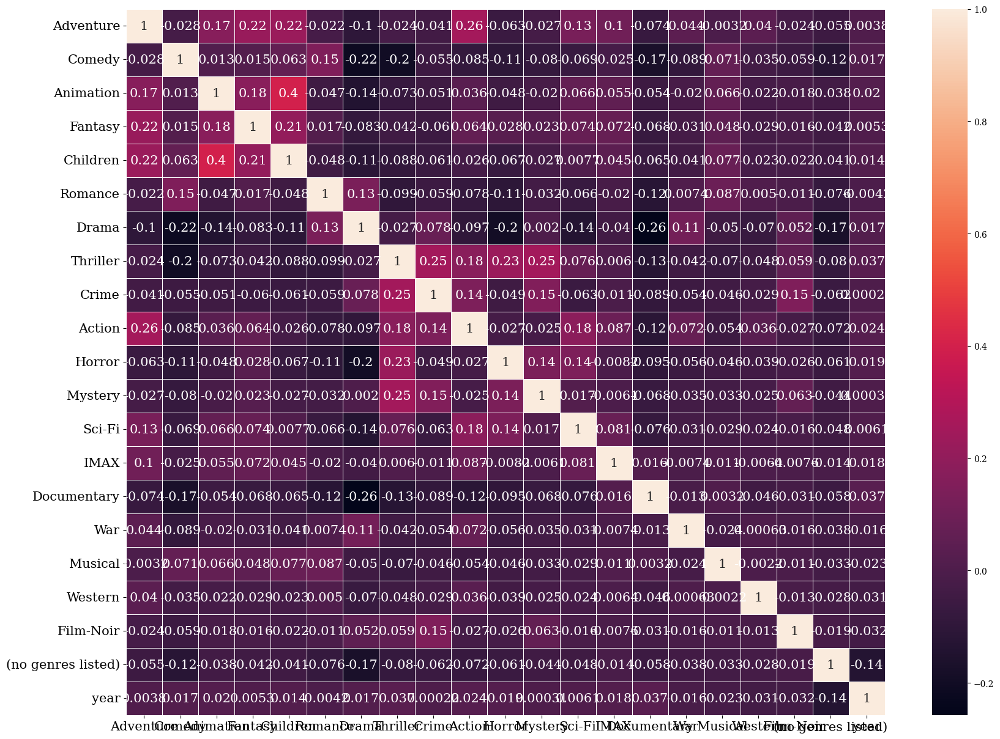

In [ ]:
#Code to plot correlation between genres

df_movies_new
def plot_corr(df):
    plt.subplots(figsize=(20, 15))
    sns.heatmap(df.corr(),annot=True,linewidths=.5,annot_kws={"fontsize":15})
    plt.yticks(rotation=0,fontsize=15)
    plt.xticks(rotation=0,fontsize=15)
    
    plt.show()

plot_corr(df_movies_new[df_movies_new.columns[3:len(df_movies_new.columns)-1]])

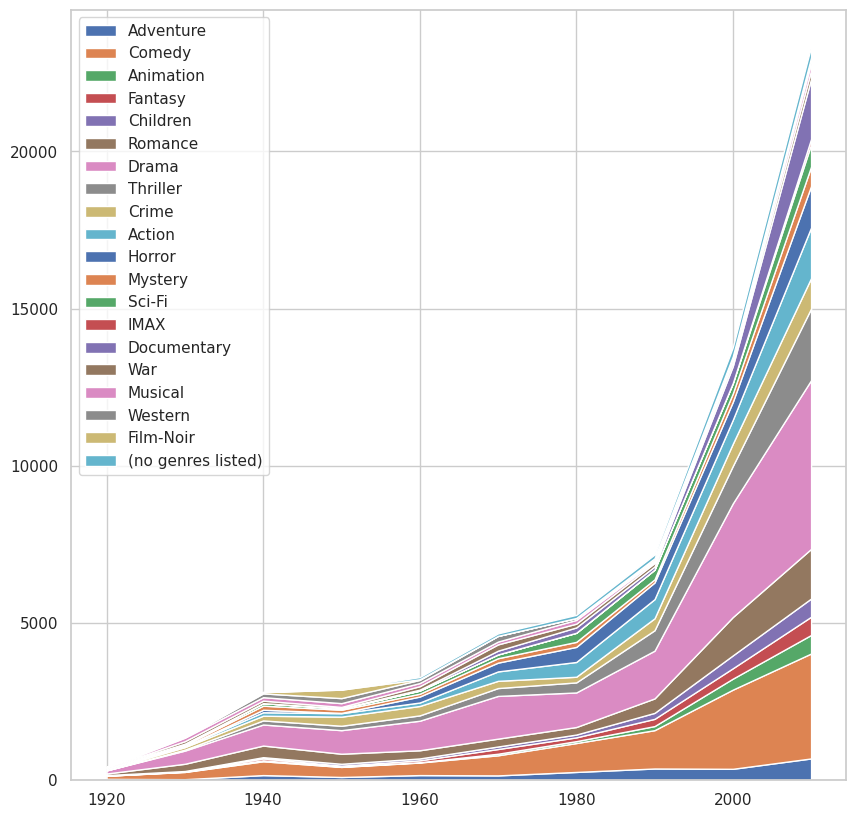

In [ ]:
#Plot between year of release and movies

temp = list(df_movies_new["year"].unique())
temp.remove(0)
# print(min(temp))
all_genres = list(df_movies_new.columns)[3:len(df_movies_new.columns)-2]
# print(all_genres)
y_all = []
x_ticks = []
for year in range(1920,max(temp) + 10-(max(temp)%10),10):
  y_temp = np.zeros(len(all_genres))
  x_ticks.append(year)
  for i in range(year,year+10):
    df_movies_temp = df_movies_new[df_movies_new["year"]==year]
    for j in range(len(all_genres)):
      y_temp[j] += len(df_movies_temp[df_movies_temp[all_genres[j]]==1])
  y_all.append(y_temp)

import numpy as np
import matplotlib.pyplot as plt
# x_ticks.append(2010)
plt.figure(figsize = (10,10))
plt.stackplot(x_ticks,np.array(y_all).T, labels=all_genres)
plt.legend(loc='upper left')

plt.show()

In [ ]:
#copy_ratings.drop(["year","month","hour"],axis = 1,inplace=True)
copy_ratings

,userId,movieId,rating,timestamp
0,1,169,2.5,1204927694
1,1,2471,3.0,1204927438
2,1,48516,5.0,1204927435
3,2,2571,3.5,1436165433
4,2,109487,4.0,1436165496
...,...,...,...,...
22884372,247753,49530,5.0,1430437962
22884373,247753,69481,3.0,1430437984
22884374,247753,74458,4.0,1430437968
22884375,247753,76093,5.0,1430437811


In [ ]:
print(all_generes_list)

['Animation', 'Comedy', 'Adventure', 'Fantasy', 'Children', 'Romance', 'Drama', 'Action', 'Crime', 'Thriller', 'Horror', 'Mystery', 'Sci-Fi', 'IMAX', 'Documentary', 'War', 'Musical', 'Western', 'Film-Noir', '(no genres listed)']


In [ ]:
user_rating_df

,userId,avg_rating,Rating_no,Weighted rating
0,1,3.500,3,3.590
1,2,4.125,4,3.600
2,3,4.250,4,3.602
3,4,3.730,183,3.653
4,5,3.460,25,3.578
...,...,...,...,...
247748,247749,3.600,5,3.591
247749,247750,3.800,70,3.640
247750,247751,4.211,190,3.874
247751,247752,2.727,33,3.481


In [ ]:
temp_list = list(user_rating_df["Rating_no"].to_numpy())
temp_id = user_rating_df["userId"].to_numpy()

In [ ]:
#Code to return userIds with less than 1000 ratings

print(temp_list)
temp_list.sort(reverse = True)
print(temp_list)
l = len(temp_list)

for i in range(0,len(temp_list),1):
  if(temp_list[i]<1000):
    end_index = i
    break
print(end_index)

[3, 4, 4, 183, 25, 18, 20, 15, 16, 30, 72, 89, 152, 118, 477, 21, 1020, 46, 23, 235, 166, 15, 148, 45, 16, 51, 5, 119, 3, 125, 85, 42, 11, 177, 5, 24, 315, 342, 440, 176, 56, 23, 10, 15, 126, 16, 359, 67, 27, 330, 37, 18, 60, 50, 90, 44, 7, 134, 235, 163, 5, 5, 190, 93, 19, 88, 5, 210, 18, 90, 2, 4, 15, 15, 370, 23, 16, 130, 8, 11, 30, 18, 5, 15, 17, 20, 15, 61, 89, 27, 10, 79, 10, 150, 13, 10, 81, 43, 150, 81, 8, 8, 8, 55, 15, 1015, 39, 1, 10, 60, 20, 15, 35, 865, 86, 23, 75, 113, 15, 431, 148, 201, 35, 70, 32, 6, 16, 23, 216, 22, 55, 29, 66, 15, 151, 33, 427, 6, 41, 54, 17, 18, 23, 2, 9, 22, 8, 20, 225, 31, 84, 31, 7, 21, 39, 5, 39, 50, 336, 92, 113, 5, 12, 207, 24, 69, 23, 35, 15, 6, 105, 6, 2, 47, 283, 545, 15, 933, 48, 36, 34, 65, 149, 61, 14, 15, 42, 105, 15, 11, 19, 23, 24, 27, 10, 22, 17, 605, 31, 15, 86, 23, 15, 2, 29, 748, 51, 10, 16, 71, 12, 158, 8, 15, 1, 37, 267, 22, 330, 16, 24, 164, 13, 58, 31, 388, 43, 146, 12, 121, 16, 21, 33, 6, 113, 39, 186, 23, 21, 11, 514, 6, 28, 7

In [ ]:
small_list = temp_list[0:end_index]

print(small_list)

[9281, 7515, 7057, 6015, 5801, 5748, 5691, 5631, 5597, 5356, 5169, 5117, 4785, 4707, 4658, 4450, 4354, 4281, 4236, 4235, 4201, 4101, 4021, 3958, 3864, 3813, 3804, 3797, 3778, 3741, 3714, 3685, 3650, 3609, 3605, 3600, 3539, 3508, 3452, 3449, 3448, 3426, 3419, 3419, 3410, 3399, 3322, 3296, 3289, 3282, 3252, 3245, 3219, 3191, 3187, 3171, 3149, 3120, 3118, 3111, 3101, 3084, 3063, 3056, 3037, 3027, 3014, 3000, 2978, 2966, 2965, 2950, 2943, 2914, 2909, 2893, 2888, 2886, 2879, 2877, 2872, 2871, 2845, 2837, 2813, 2806, 2801, 2784, 2772, 2766, 2763, 2759, 2753, 2745, 2740, 2731, 2711, 2711, 2707, 2697, 2691, 2670, 2654, 2651, 2648, 2645, 2644, 2639, 2639, 2633, 2632, 2630, 2630, 2608, 2608, 2600, 2597, 2594, 2594, 2589, 2582, 2576, 2575, 2555, 2553, 2550, 2545, 2538, 2534, 2531, 2529, 2527, 2527, 2518, 2517, 2514, 2512, 2499, 2495, 2491, 2488, 2484, 2478, 2478, 2476, 2464, 2459, 2456, 2454, 2450, 2447, 2444, 2435, 2415, 2411, 2405, 2400, 2391, 2383, 2382, 2378, 2372, 2369, 2368, 2363, 2361, 236

In [ ]:
#Codeto find which Users to keep and which to drop

keep_id = []
drop_id = []
temp = user_rating_df['Rating_no'].to_numpy()
for i in range(0,len(temp_id),1):
  if temp[i] in small_list:
    keep_id.append(i+1)
  else:
    drop_id.append(i+1)

In [ ]:
print(keep_id)
print(drop_id)

[17, 106, 373, 402, 670, 707, 768, 815, 1046, 1160, 1204, 1361, 1573, 1599, 1667, 1950, 2108, 2340, 2372, 2397, 2404, 2432, 2452, 2484, 2569, 2596, 2655, 2711, 2726, 2964, 3127, 3167, 3186, 3388, 3596, 3720, 3734, 3817, 4036, 4099, 4193, 4208, 4280, 4292, 4415, 4459, 4588, 4733, 4818, 4847, 5045, 5104, 5133, 5213, 5326, 5576, 5912, 6157, 6199, 6262, 6296, 6420, 6439, 6482, 6530, 6701, 7403, 7426, 7528, 7613, 7618, 7783, 8232, 8316, 8405, 8528, 8558, 8645, 8675, 8863, 9033, 9051, 9101, 9125, 9460, 9658, 9663, 9733, 9750, 9797, 9820, 9880, 9929, 9944, 10088, 10296, 10298, 10315, 10368, 10565, 10863, 11098, 11332, 11357, 11523, 11539, 11592, 11769, 11778, 11905, 11957, 12110, 12120, 12334, 12542, 12720, 12728, 12921, 12924, 12986, 13053, 13228, 13342, 13404, 13444, 13614, 13654, 13718, 13804, 14048, 14067, 14257, 14532, 14551, 14572, 14588, 14703, 14815, 14860, 14984, 15010, 15030, 15209, 15210, 15286, 15466, 15474, 15574, 15670, 15679, 15821, 15961, 15994, 16382, 16388, 16456, 16506, 167

In [ ]:
copy_ratings_np = copy_ratings.to_numpy()
copy_ratings_np

array([[1.00000000e+00, 1.69000000e+02, 2.50000000e+00, 1.20492769e+09],
       [1.00000000e+00, 2.47100000e+03, 3.00000000e+00, 1.20492744e+09],
       [1.00000000e+00, 4.85160000e+04, 5.00000000e+00, 1.20492744e+09],
       ...,
       [2.47753000e+05, 7.44580000e+04, 4.00000000e+00, 1.43043797e+09],
       [2.47753000e+05, 7.60930000e+04, 5.00000000e+00, 1.43043781e+09],
       [2.47753000e+05, 1.30636000e+05, 5.00000000e-01, 1.43043772e+09]])

In [ ]:
#Code to store information for every userId in a dictionary

df_to_dict = {}
user_ids = copy_ratings['userId'].to_numpy()


for i in range(0,len(copy_ratings),1):
  if user_ids[i] in df_to_dict.keys():
    temp_list = copy_ratings_np[i,:]
    df_to_dict[user_ids[i]].append(temp_list)
  else:
    df_to_dict[user_ids[i]] = []
    temp_list = copy_ratings_np[i,:]
    df_to_dict[user_ids[i]].append(temp_list)

In [ ]:
#Code to select only those userIds which are in the keep_id list

neural_list = []

for i in range(0,len(keep_id),1):
  t = keep_id[i]
  for j in range(0,len(df_to_dict[keep_id[i]]),1):
    neural_list.append(df_to_dict[keep_id[i]][j])

In [ ]:
neural_df = pd.DataFrame(neural_list, columns = copy_ratings.columns)
neural_df

,userId,movieId,rating,timestamp
0,17.0,1.0,5.0,9.449916e+08
1,17.0,2.0,3.0,9.449911e+08
2,17.0,3.0,2.0,9.449937e+08
3,17.0,4.0,3.0,9.449932e+08
4,17.0,5.0,4.0,9.449937e+08
...,...,...,...,...
3164712,247662.0,132046.0,2.5,1.432513e+09
3164713,247662.0,135133.0,3.0,1.448031e+09
3164714,247662.0,137437.0,3.0,1.436314e+09
3164715,247662.0,138210.0,4.0,1.452934e+09


In [ ]:
genre_names = list(df_movies_new.columns[3:])
print(genre_names)

['Animation', 'Comedy', 'Adventure', 'Fantasy', 'Children', 'Romance', 'Drama', 'Action', 'Crime', 'Thriller', 'Horror', 'Mystery', 'Sci-Fi', 'IMAX', 'Documentary', 'War', 'Musical', 'Western', 'Film-Noir', '(no genres listed)', 'year']


In [ ]:
neural_df['count'] = np.zeros((len(neural_df),1))
neural_df['avg_rating'] = np.zeros((len(neural_df),1))
neural_df

,userId,movieId,rating,timestamp,count,avg_rating
0,17.0,1.0,5.0,9.449916e+08,0.0,0.0
1,17.0,2.0,3.0,9.449911e+08,0.0,0.0
2,17.0,3.0,2.0,9.449937e+08,0.0,0.0
3,17.0,4.0,3.0,9.449932e+08,0.0,0.0
4,17.0,5.0,4.0,9.449937e+08,0.0,0.0
...,...,...,...,...,...,...
3164712,247662.0,132046.0,2.5,1.432513e+09,0.0,0.0
3164713,247662.0,135133.0,3.0,1.448031e+09,0.0,0.0
3164714,247662.0,137437.0,3.0,1.436314e+09,0.0,0.0
3164715,247662.0,138210.0,4.0,1.452934e+09,0.0,0.0


In [ ]:
for i in range(0,len(genre_names),1):
  temp_list = np.zeros((len(neural_df),1))
  neural_df[genre_names[i]] = temp_list

neural_df

,userId,movieId,rating,timestamp,count,avg_rating,Animation,Comedy,Adventure,Fantasy,...,Mystery,Sci-Fi,IMAX,Documentary,War,Musical,Western,Film-Noir,(no genres listed),year
0,17.0,1.0,5.0,9.449916e+08,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,17.0,2.0,3.0,9.449911e+08,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,17.0,3.0,2.0,9.449937e+08,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,17.0,4.0,3.0,9.449932e+08,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,17.0,5.0,4.0,9.449937e+08,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3164712,247662.0,132046.0,2.5,1.432513e+09,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3164713,247662.0,135133.0,3.0,1.448031e+09,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3164714,247662.0,137437.0,3.0,1.436314e+09,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3164715,247662.0,138210.0,4.0,1.452934e+09,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print(all_years_movies)

[1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1994, 1995, 1994, 1995, 1995, 1995, 1995, 1994, 1995, 1995, 1996, 1995, 1996, 1996, 1996, 1996, 1995, 1995, 1995, 1996, 1995, 1995, 1995, 1996, 1996, 1995, 1995, 1995, 1996, 1995, 1995, 1995, 1995, 1995, 1995, 1996, 1996, 1996, 1995, 1995, 1996, 1995, 1996, 1996, 1995, 1995, 1994, 1995, 1996, 1996, 1996, 1996, 1996, 1995, 1994, 1996, 1996, 1995, 1995, 1976, 1995, 1996, 1995, 1995, 1995, 1995, 1996, 1995, 1996, 1992, 1992, 1994, 1995, 1996, 1994, 1994, 1994, 1996, 1995, 1995, 1995, 1995, 1995, 1996, 1995, 1995, 1995, 1995, 1996, 1996, 1988, 1995, 1995, 1995, 1995, 1995, 1995, 1994, 1995, 1995, 1995, 1995, 1967, 1995, 1995, 1995, 1995, 1995, 1995, 1995, 1994, 1995, 1995, 1995, 1995, 1995, 199

In [ ]:
#Code to store release years, genres, weighted ratings and no. of ratings for each movie

all_years_movies_dict = {}
all_genres_movies_dict = {}
all_movies_wr = {}
all_movies_count = {}

temp_id_list = df_movies_new['movieId'].to_numpy()

for i in range(0,len(all_years_movies),1):
  all_years_movies_dict[temp_id_list[i]] = all_years_movies[i]
  all_genres_movies_dict[temp_id_list[i]] = all_geners_list_for_all_rows[i]
  all_movies_wr[temp_id_list[i]] = movie_weight_rating[i]
  all_movies_count[temp_id_list[i]] = number_list[i]

In [ ]:
print(all_years_movies_dict)
print(all_genres_movies_dict)

{1: 1995, 2: 1995, 3: 1995, 4: 1995, 5: 1995, 6: 1995, 7: 1995, 8: 1995, 9: 1995, 10: 1995, 11: 1995, 12: 1995, 13: 1995, 14: 1995, 15: 1995, 16: 1995, 17: 1995, 18: 1995, 19: 1995, 20: 1995, 21: 1995, 22: 1995, 23: 1995, 24: 1995, 25: 1995, 26: 1995, 27: 1995, 28: 1995, 29: 1995, 30: 1995, 31: 1995, 32: 1995, 33: 1995, 34: 1995, 35: 1995, 36: 1995, 37: 1995, 38: 1995, 39: 1995, 40: 1995, 41: 1995, 42: 1995, 43: 1995, 44: 1995, 45: 1995, 46: 1995, 47: 1995, 48: 1995, 49: 1995, 50: 1995, 51: 1994, 52: 1995, 53: 1994, 54: 1995, 55: 1995, 56: 1995, 57: 1995, 58: 1994, 59: 1995, 60: 1995, 61: 1996, 62: 1995, 63: 1996, 64: 1996, 65: 1996, 66: 1996, 67: 1995, 68: 1995, 69: 1995, 70: 1996, 71: 1995, 72: 1995, 73: 1995, 74: 1996, 75: 1996, 76: 1995, 77: 1995, 78: 1995, 79: 1996, 80: 1995, 81: 1995, 82: 1995, 83: 1995, 84: 1995, 85: 1995, 86: 1996, 87: 1996, 88: 1996, 89: 1995, 90: 1995, 92: 1996, 93: 1995, 94: 1996, 95: 1996, 96: 1995, 97: 1995, 98: 1994, 99: 1995, 100: 1996, 101: 1996, 102: 1

In [ ]:
print(all_movies_wr)
print(all_movies_count)

{1: 3.881, 2: 3.214, 3: 3.172, 4: 2.924, 5: 3.079, 6: 3.809, 7: 3.353, 8: 3.104, 9: 3.022, 10: 3.425, 11: 3.633, 12: 2.742, 13: 3.205, 14: 3.382, 15: 2.808, 16: 3.749, 17: 3.921, 18: 3.35, 19: 2.641, 20: 2.927, 21: 3.557, 22: 3.281, 23: 3.142, 24: 3.17, 25: 3.647, 26: 3.477, 27: 3.289, 28: 3.818, 29: 3.841, 30: 3.393, 31: 3.227, 32: 3.871, 33: 3.049, 34: 3.621, 35: 3.329, 36: 3.902, 37: 3.047, 38: 2.984, 39: 3.399, 40: 3.344, 41: 3.72, 42: 3.053, 43: 3.356, 44: 2.656, 45: 3.344, 46: 3.222, 47: 4.042, 48: 2.947, 49: 3.156, 50: 4.296, 51: 3.036, 52: 3.495, 53: 3.139, 54: 2.959, 55: 3.14, 56: 2.977, 57: 3.248, 58: 3.904, 59: 3.143, 60: 3.074, 61: 3.254, 62: 3.726, 63: 3.094, 64: 2.907, 65: 2.508, 66: 2.416, 67: 3.097, 68: 3.283, 69: 3.467, 70: 3.273, 71: 2.659, 72: 3.294, 73: 3.63, 74: 3.254, 75: 2.84, 76: 3.021, 77: 3.123, 78: 3.121, 79: 3.148, 80: 3.303, 81: 3.225, 82: 3.754, 83: 3.281, 84: 3.101, 85: 3.412, 86: 3.41, 87: 2.718, 88: 3.117, 89: 3.119, 90: 3.104, 92: 2.916, 93: 2.694, 94:

In [ ]:
neural_df

,userId,movieId,rating,timestamp,count,avg_rating,Animation,Comedy,Adventure,Fantasy,...,Mystery,Sci-Fi,IMAX,Documentary,War,Musical,Western,Film-Noir,(no genres listed),year
0,17.0,1.0,5.0,9.449916e+08,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,17.0,2.0,3.0,9.449911e+08,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,17.0,3.0,2.0,9.449937e+08,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,17.0,4.0,3.0,9.449932e+08,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,17.0,5.0,4.0,9.449937e+08,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3164712,247662.0,132046.0,2.5,1.432513e+09,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3164713,247662.0,135133.0,3.0,1.448031e+09,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3164714,247662.0,137437.0,3.0,1.436314e+09,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3164715,247662.0,138210.0,4.0,1.452934e+09,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
#Code to fill values for each row in neural_df according to our created dictionaries

temp_neural = neural_df.to_numpy()

temp_names = list(neural_df.columns)

for i in range(0,len(temp_names),1):
  if(temp_names[i] == genre_names[0]):
    m = i
    break

for i in range(0,len(temp_neural),1):
  l = len(temp_neural[i])-1
  t = int(temp_neural[i][1])
  temp_neural[i][l-1] = all_years_movies_dict[t]
  temp_neural[i][m-2] = all_movies_count[t]
  temp_neural[i][m-1] = all_movies_wr[t]
  k = 0
  for j in range(m,l,1):
    temp_neural[i][j] = all_genres_movies_dict[t][k]
    k+=1

In [ ]:
neural_df = pd.DataFrame(temp_neural,columns = temp_names)
neural_df

,userId,movieId,rating,timestamp,count,avg_rating,Animation,Comedy,Adventure,Fantasy,...,Mystery,Sci-Fi,IMAX,Documentary,War,Musical,Western,Film-Noir,(no genres listed),year
0,17.0,1.0,5.0,9.449916e+08,60424.0,3.881,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,17.0,2.0,3.0,9.449911e+08,23950.0,3.214,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,17.0,3.0,2.0,9.449937e+08,15267.0,3.172,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,17.0,4.0,3.0,9.449932e+08,2935.0,2.924,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,17.0,5.0,4.0,9.449937e+08,14769.0,3.079,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3164712,247662.0,132046.0,2.5,1.432513e+09,588.0,3.106,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3164713,247662.0,135133.0,3.0,1.448031e+09,606.0,3.204,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3164714,247662.0,137437.0,3.0,1.436314e+09,1.0,3.052,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3164715,247662.0,138210.0,4.0,1.452934e+09,21.0,3.050,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
neural_df.drop(["year",'timestamp'],axis = 1,inplace = True)
neural_df

,userId,movieId,rating,count,avg_rating,Animation,Comedy,Adventure,Fantasy,Children,...,Horror,Mystery,Sci-Fi,IMAX,Documentary,War,Musical,Western,Film-Noir,(no genres listed)
0,17.0,1.0,5.0,60424.0,3.881,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,17.0,2.0,3.0,23950.0,3.214,0.0,0.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,17.0,3.0,2.0,15267.0,3.172,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,17.0,4.0,3.0,2935.0,2.924,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,17.0,5.0,4.0,14769.0,3.079,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3164712,247662.0,132046.0,2.5,588.0,3.106,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3164713,247662.0,135133.0,3.0,606.0,3.204,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3164714,247662.0,137437.0,3.0,1.0,3.052,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3164715,247662.0,138210.0,4.0,21.0,3.050,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
neural_df

new_user_df = neural_df.copy(deep = True)

In [ ]:
user_data_dict = {}

temp_new_user_np = new_user_df.to_numpy()

for i in range(0,len(temp_new_user_np),1):
  t = int(temp_new_user_np[i][0])
  if t in user_data_dict.keys():
    user_data_dict[t].append(temp_new_user_np[i][1:])
  else:
    user_data_dict[t] = []
    user_data_dict[t].append(temp_new_user_np[i][1:])
  

In [ ]:
new_key_list = list(user_data_dict.keys())

for i in range(0,len(new_key_list),1):
  temp_arr = np.array(user_data_dict[new_key_list[i]])
  temp_arr = temp_arr[temp_arr[:,1].argsort()]
  user_data_dict[new_key_list[i]] = temp_arr[len(temp_arr)-500 :len(temp_arr)]


In [ ]:
print(genre_names)

['Animation', 'Comedy', 'Adventure', 'Fantasy', 'Children', 'Romance', 'Drama', 'Action', 'Crime', 'Thriller', 'Horror', 'Mystery', 'Sci-Fi', 'IMAX', 'Documentary', 'War', 'Musical', 'Western', 'Film-Noir', '(no genres listed)', 'year']


In [ ]:
df_movies_new['Weighted rating'] = movie_weight_rating
df_movies_new

,movieId,title,genres_list,Animation,Comedy,Adventure,Fantasy,Children,Romance,Drama,...,Sci-Fi,IMAX,Documentary,War,Musical,Western,Film-Noir,(no genres listed),year,Weighted rating
0,1,Toy Story (1995),"[Animation, Comedy, Adventure, Fantasy, Children]",1,1,1,1,1,0,0,...,0,0,0,0,0,0,0,0,1995,3.881
1,2,Jumanji (1995),"[Fantasy, Children, Adventure]",0,0,1,1,1,0,0,...,0,0,0,0,0,0,0,0,1995,3.214
2,3,Grumpier Old Men (1995),"[Romance, Comedy]",0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1995,3.172
3,4,Waiting to Exhale (1995),"[Romance, Comedy, Drama]",0,1,0,0,0,1,1,...,0,0,0,0,0,0,0,0,1995,2.924
4,5,Father of the Bride Part II (1995),[Comedy],0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1995,3.079
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34203,151697,Grand Slam (1967),[Thriller],0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1967,3.052
34204,151701,Bloodmoney (2010),[(no genres listed)],0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,2010,3.053
34205,151703,The Butterfly Circus (2009),[Drama],0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,2009,3.054
34206,151709,Zero (2015),"[Drama, Sci-Fi]",0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,0,2015,3.052


# Scratch Movie Recommender

In [ ]:
# importing difflib library and creating scratch function for movie name , the theory which we told 
# in report , the movie recommendations are based on genres specific

import difflib
def extract_all_words(inp):
  all_words = []
  word = ""
  for i in range(len(inp)):
    if(inp[i]==" "):
      all_words.append(word)
      word = ""
    elif(inp[i]=="(" or inp[i]==")"):
      break
    else:
      word += inp[i]
  return all_words

def get_recommendations_moviename(movie1):
  close_matches = difflib.get_close_matches(movie1,df_movies_new["title"].to_list(),5,0.3)
  # print(close_matches)
  if len(close_matches)==0:
    print("Cant find movie in Database")
    return 
  
  genres_list_1 = {}
  # genres_list_2 = {}
  # genres_list_3 = {}
  for j in range(len(df_movies_new)):
    if(df_movies_new["title"].iloc[j] in close_matches):
      # print(df_movies_new["title"].iloc[j])
      temp = list(df_movies_new["genres_list"].iloc[j])
      for i in temp:
        if(i in genres_list_1.keys()):
          genres_list_1[i] +=1
        else:
          genres_list_1[i] =1
    
  genres_list_1 = sorted(genres_list_1.items(), key=lambda x:x[1])
  # print(genres_list_1)
  
  all_genres = []
  no_of_genres_to_choose = 3
  for i in range(len(genres_list_1)-1,max(len(genres_list_1)-1-no_of_genres_to_choose,0),-1):
    all_genres.append(genres_list_1[i][0])
  all_genres = set(all_genres)
  # print(all_genres)
  no_of_common = {}
  for i in range(len(df_movies)):
    cnt = 0
    for k in all_genres:
      if(df_movies_new[k].iloc[i]==1):
        cnt+=1
    if(cnt in no_of_common.keys()):
      no_of_common[cnt].append(df_movies["title"].iloc[i])
    else:
      no_of_common[cnt] = [df_movies["title"].iloc[i]]
  # print(no_of_common)
  # return no_of_common
  print()
  print("Top Movie Reccomendations for movie",movie1)
  max_no = max(list(no_of_common.keys()))
  # print(no_of_common[max_no])
  
  similar_matches = close_matches[0:min(len(close_matches),2)]
  
  all_movie_combined_list = [i for i in similar_matches]
  # print(all_movie_combined_list)
  while len(all_movie_combined_list)<10:
    if max_no in no_of_common.keys():
      for i in no_of_common[max_no]:
        if(len(all_movie_combined_list)<10):
          all_movie_combined_list.append(i)
    max_no -=1
  # print(len(all_movie_combined_list))
  print()
  for i in all_movie_combined_list:
    print(i)
  return 
  
  
get_recommendations_moviename("Cars")
get_recommendations_moviename("Batman")


Top Movie Reccomendations for movie Cars

Cars (2006)
Cars 2 (2011)
Toy Story (1995)
Goofy Movie, A (1995)
Aladdin (1992)
Space Jam (1996)
Oliver & Company (1988)
Wallace & Gromit: A Close Shave (1995)
Aladdin and the King of Thieves (1996)
Wallace & Gromit: The Wrong Trousers (1993)

Top Movie Reccomendations for movie Batman

Batman (1989)
Batman (1966)
Rumble in the Bronx (Hont faan kui) (1995)
Batman Forever (1995)
Hackers (1995)
Getaway, The (1994)
Hard Target (1993)
North Star (a.k.a. Tashunga) (1995)
Black Mask (Hak hap) (1996)
Breaker! Breaker! (1977)


In [ ]:
# A helper function which will help us in extracting all the words in a sentence
def extract_all_words(inp):
  all_words = []
  word = ""
  for i in range(len(inp)):
    if(inp[i]==" "):
      all_words.append(word)
      word = ""
    elif(inp[i]=="(" or inp[i]==")"):
      break
    else:
      word += inp[i]
  return all_words
# all_movies_names_list = []
# for i in range(len(df_movies_new)):
#   all_movies_names_list.append(extract_all_words(df_movies_new["title"].iloc[i]))
# flatlist=list(set([element for sublist in all_movies_names_list for element in sublist]))
# len(flatlist)

In [ ]:
# Importing sentence transformers library
from sentence_transformers import SentenceTransformer,util
model = SentenceTransformer('distilbert-base-nli-mean-tokens')

In [ ]:
#Using that library to predict similar tags among the whole dataset and then predicting results
import difflib
def extract_all_words(inp):
  all_words = []
  word = ""
  for i in range(len(inp)):
    if(inp[i]==" "):
      all_words.append(word)
      word = ""
    elif(inp[i]=="(" or inp[i]==")"):
      break
    else:
      word += inp[i]
  return all_words

def get_recommendations_tags(tagstring):
  sentences = [tagstring]
  no_of_rows = 500
  for i in range(no_of_rows):
    sentences.append(str(df_movies_new["tags"].iloc[i]))
  sentence_embeddings = model.encode(sentences)
  results = []
  for i in range(1,len(sentences)):
    results.append((i-1,util.pytorch_cos_sim(sentence_embeddings[0], sentence_embeddings[i]).numpy()[0][0]))
  sorted_results = sorted(results,key= lambda x:x[1],reverse=True)
  print("Top 10 Reccomendations for the tags - ",tagstring,"is")
  for i in range(10):
    print(df_movies_new["title"].iloc[sorted_results[i][0]])
  return
  
  
get_recommendations_tags("war action fighting guns")

Top 10 Reccomendations for the tags -  war action fighting guns is
Hunted, The (1995)
Before the Rain (Pred dozhdot) (1994)
Brother Minister: The Assassination of Malcolm X (1994)
National Lampoon's Senior Trip (1995)
Red Firecracker, Green Firecracker (Pao Da Shuang Deng) (1994)
Heaven & Earth (1993)
Cops and Robbersons (1994)
Life with Mikey (1993)
Lightning Jack (1994)
Geronimo: An American Legend (1993)


In [ ]:
#Giving genre specific recommendations based on ratings 
def get_recommendations_genres(genre1,genre2):
  df_temp = df_movies_new[df_movies_new[genre1]==1]
  print("Top 10 Movies in genres",genre1,genre2,"according to ratings-")
  print()
  for i in range(min(10,len(df_temp[df_temp[genre2]==1]))):
    print(df_temp[df_temp[genre2]==1]["title"].iloc[i],"with rating",df_temp[df_temp[genre2]==1]["Weighted rating"].iloc[i])

get_recommendations_genres("Crime","Drama")

Top 10 Movies in genres Crime Drama according to ratings-

Shawshank Redemption, The (1994) with rating 4.424
Godfather, The (1972) with rating 4.328
Godfather: Part II, The (1974) with rating 4.232
Fight Club (1999) with rating 4.21
Dark Knight, The (2008) with rating 4.164
Pulp Fiction (1994) with rating 4.149
City of God (Cidade de Deus) (2002) with rating 4.144
Goodfellas (1990) with rating 4.144
Inception (2010) with rating 4.119
American History X (1998) with rating 4.113


In [ ]:
#Giving genre specific recommendations based on ratings 
def get_recommendations_genre(genre1):
  df_temp = df_movies_new[df_movies_new[genre1]==1]
  print("Movies for you in genre",genre1,"according to ratings-")
  print()
  for i in range(min(10,len(df_temp[df_temp[genre1]==1]))):
    print(df_temp[df_temp[genre1]==1]["title"].iloc[i],"with rating",df_temp[df_temp[genre1]==1]["Weighted rating"].iloc[i])

get_recommendations_genre('Animation')

Movies for you in genre Animation according to ratings-

Toy Story (1995) with rating 3.881
Balto (1995) with rating 3.205
Pocahontas (1995) with rating 2.947
Goofy Movie, A (1995) with rating 3.07
Gumby: The Movie (1995) with rating 2.891
Swan Princess, The (1994) with rating 3.056
Lion King, The (1994) with rating 3.774
Secret Adventures of Tom Thumb, The (1993) with rating 3.105
Nightmare Before Christmas, The (1993) with rating 3.703
Pagemaster, The (1994) with rating 2.89


In [ ]:
#Giving user specific recommendations 
def user_predict(user_id,dict1 = user_data_dict):
  user_list = list(dict1.keys())
  if user_id not in user_list:
    print("Sorry, user not found")
  else:
    print()
    temp_data = np.array(dict1[user_id])
    temp_data = temp_data[:,4:]
    genre_count = np.zeros((len(temp_data[0]),1))
    for i in range(0,len(temp_data),1):
      for j in range(0,len(temp_data[i]),1):
        if temp_data[i][j] == 1:
          genre_count[j] += 1
    
    genre_index = genre_count[:,0].argsort()
    fav_genres = genre_index[len(genre_index)-3:len(genre_index)]

    genre_str = ''

    for i in range(0,len(fav_genres),1):
      genre_str += ' ' + genre_names[fav_genres[len(fav_genres)-i-1]] + ','

    print("Your Top 3 favourite genres are",genre_str[0:len(genre_str)-1])
    print()

    for i in range(0,len(fav_genres),1):
      get_recommendations_genre(genre_names[fav_genres[len(fav_genres)-i-1]])
      print()


In [ ]:
user_predict(17)


Your Top 3 favourite genres are  Drama, Comedy, Adventure

Movies for you in genre Drama according to ratings-

Waiting to Exhale (1995) with rating 2.924
American President, The (1995) with rating 3.633
Nixon (1995) with rating 3.382
Casino (1995) with rating 3.749
Sense and Sensibility (1995) with rating 3.921
Money Train (1995) with rating 2.927
Copycat (1995) with rating 3.281
Powder (1995) with rating 3.17
Leaving Las Vegas (1995) with rating 3.647
Othello (1995) with rating 3.477

Movies for you in genre Comedy according to ratings-

Toy Story (1995) with rating 3.881
Grumpier Old Men (1995) with rating 3.172
Waiting to Exhale (1995) with rating 2.924
Father of the Bride Part II (1995) with rating 3.079
Sabrina (1995) with rating 3.353
American President, The (1995) with rating 3.633
Dracula: Dead and Loving It (1995) with rating 2.742
Four Rooms (1995) with rating 3.35
Ace Ventura: When Nature Calls (1995) with rating 2.641
Money Train (1995) with rating 2.927

Movies for you i

#Collaborative Filtering

In [ ]:
#Till now we were doing very basic recommendations,
# Now we will take into the user history also , like which movies user liked the most and then will recommend those movies only 
df_ratings

,userId,movieId,rating,timestamp
0,1,169,2.5,1204927694
1,1,2471,3.0,1204927438
2,1,48516,5.0,1204927435
3,2,2571,3.5,1436165433
4,2,109487,4.0,1436165496
...,...,...,...,...
22884372,247753,49530,5.0,1430437962
22884373,247753,69481,3.0,1430437984
22884374,247753,74458,4.0,1430437968
22884375,247753,76093,5.0,1430437811


In [ ]:
df_collab = df_ratings.copy(deep=True)

In [ ]:
df_collab.drop(['timestamp'],axis=1,inplace=True)

In [ ]:
df_collab

,userId,movieId,rating
0,1,169,2.5
1,1,2471,3.0
2,1,48516,5.0
3,2,2571,3.5
4,2,109487,4.0
...,...,...,...
22884372,247753,49530,5.0
22884373,247753,69481,3.0
22884374,247753,74458,4.0
22884375,247753,76093,5.0


In [ ]:
df_movies

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy
...,...,...,...
34203,151697,Grand Slam (1967),Thriller
34204,151701,Bloodmoney (2010),(no genres listed)
34205,151703,The Butterfly Circus (2009),Drama
34206,151709,Zero (2015),Drama|Sci-Fi


In [ ]:
col_filt = pd.merge(df_collab,df_movies, on='movieId')

In [ ]:
col_filt

,userId,movieId,rating,title,genres
0,1,169,2.5,Free Willy 2: The Adventure Home (1995),Adventure|Children|Drama
1,13,169,1.0,Free Willy 2: The Adventure Home (1995),Adventure|Children|Drama
2,14,169,3.0,Free Willy 2: The Adventure Home (1995),Adventure|Children|Drama
3,17,169,1.0,Free Willy 2: The Adventure Home (1995),Adventure|Children|Drama
4,68,169,1.0,Free Willy 2: The Adventure Home (1995),Adventure|Children|Drama
...,...,...,...,...,...
22884372,247509,95581,4.0,"Flying Fleet, The (1929)",Adventure|Drama|Romance
22884373,247534,111838,4.0,"Man Named Rocca, A (Nommé La Rocca, Un) (Man C...",Drama
22884374,247662,137437,3.0,Son of a Lion (2007),(no genres listed)
22884375,247670,145939,5.0,Sandesham (1991),Children|Comedy


In [ ]:
col_filt.drop(['genres','movieId'],axis=1,inplace=True)

In [ ]:
col_filt

,userId,rating,title
0,1,2.5,Free Willy 2: The Adventure Home (1995)
1,13,1.0,Free Willy 2: The Adventure Home (1995)
2,14,3.0,Free Willy 2: The Adventure Home (1995)
3,17,1.0,Free Willy 2: The Adventure Home (1995)
4,68,1.0,Free Willy 2: The Adventure Home (1995)
...,...,...,...
22884372,247509,4.0,"Flying Fleet, The (1929)"
22884373,247534,4.0,"Man Named Rocca, A (Nommé La Rocca, Un) (Man C..."
22884374,247662,3.0,Son of a Lion (2007)
22884375,247670,5.0,Sandesham (1991)


In [ ]:
# #Working on a subset of 1000 values
# index_list = []
# for i in range(1000):
  
#   k = random.randint(0,22000000)
#   index_list.append(k)
#   if random.randint(0,1):
#     index_list.append(k)
# colab_subset = col_filt.iloc[index_list]

In [ ]:
# colab_subset = pd.concat([col_filt.iloc[:7000,:],col_filt.iloc[110000:117000,:],col_filt.iloc[210000:2170000,:]],axis=0)

In [ ]:
colab_subset = col_filt.iloc[100000:400000+200000,:]
len(colab_subset["title"].unique())

23

In [ ]:
colab_table = colab_subset.pivot_table(index='title', columns='userId', values='rating', aggfunc='mean')

In [ ]:
colab_table

userId,2,3,4,5,11,12,13,14,15,16,...,247737,247738,247739,247741,247742,247744,247747,247750,247751,247753
title,,,,,,,,,,,,,,,,,,,,,
"Adventures of Priscilla, Queen of the Desert, The (1994)",NaN,NaN,4.0,NaN,NaN,4.0,NaN,NaN,3.5,NaN,...,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
At First Sight (1999),NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN
Barcelona (1994),NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Beautiful Girls (1996),NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Bottle Rocket (1996),NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Casino (1995),NaN,NaN,4.0,NaN,NaN,NaN,NaN,3.0,NaN,NaN,...,NaN,4.0,NaN,4.5,NaN,NaN,NaN,NaN,NaN,NaN
Clueless (1995),NaN,NaN,4.0,NaN,NaN,4.0,NaN,3.0,5.0,NaN,...,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dave (1993),NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,3.5,NaN,...,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Forrest Gump (1994),NaN,4.0,2.0,NaN,NaN,NaN,NaN,5.0,4.5,NaN,...,NaN,3.0,NaN,NaN,NaN,NaN,5.0,NaN,4.5,5.0


In [ ]:
113*194367

21963471

In [ ]:
colab_table.isnull().sum().sum()

2601757

In [ ]:
colab_table1 = colab_table.copy(deep=True)

In [ ]:
colab_table1.fillna(0,inplace=True)

In [ ]:
colab_table1

userId,2,3,4,5,11,12,13,14,15,16,...,247737,247738,247739,247741,247742,247744,247747,247750,247751,247753
title,,,,,,,,,,,,,,,,,,,,,
"Adventures of Priscilla, Queen of the Desert, The (1994)",0.0,0.0,4.0,0.0,0.0,4.0,0.0,0.0,3.5,0.0,...,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
At First Sight (1999),0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0
Barcelona (1994),0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Beautiful Girls (1996),0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Bottle Rocket (1996),0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Casino (1995),0.0,0.0,4.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,...,0.0,4.0,0.0,4.5,0.0,0.0,0.0,0.0,0.0,0.0
Clueless (1995),0.0,0.0,4.0,0.0,0.0,4.0,0.0,3.0,5.0,0.0,...,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Dave (1993),0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,3.5,0.0,...,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Forrest Gump (1994),0.0,4.0,2.0,0.0,0.0,0.0,0.0,5.0,4.5,0.0,...,0.0,3.0,0.0,0.0,0.0,0.0,5.0,0.0,4.5,5.0


In [ ]:
zero_indices = np.argwhere(np.array(colab_table1)==0)

In [ ]:
#indices of null elements:-
print("No. of null elements is :- ",len(zero_indices))
print('\nThe indices of null elements is:-\n',zero_indices)

No. of null elements is :-  2601757

The indices of null elements is:-
 [[     0      0]
 [     0      1]
 [     0      3]
 ...
 [    22 134856]
 [    22 134857]
 [    22 134858]]


In [ ]:
len(colab_table1)

23

In [ ]:
#Application of K-Nearest Neighbours

In [ ]:
knn_colab = NearestNeighbors(metric='cosine', algorithm='brute')
knn_colab.fit(colab_table1.values)
dist_colab, indices_colab = knn_colab.kneighbors(colab_table1.values,n_neighbors=5)

In [ ]:
#Every ith row gives the indices of the 10 nearest neighbours of the ith movie
indices_colab

array([[ 0,  9, 21,  6, 18],
       [ 1, 16,  6,  7, 20],
       [ 2, 21,  9, 12,  6],
       [ 3, 21,  6,  9,  4],
       [ 4, 18,  5, 21, 19],
       [ 5, 19, 18, 15, 20],
       [ 6,  9, 20,  7, 10],
       [ 7,  9, 20, 10,  6],
       [ 8, 18, 10, 20, 19],
       [ 9, 20,  7,  6, 10],
       [10, 20,  8, 18, 19],
       [11, 22, 13,  8, 19],
       [12, 18, 21,  6, 10],
       [13, 11, 22,  8, 18],
       [14,  8, 10, 20, 18],
       [15, 19, 18, 20, 10],
       [16,  8, 20, 17,  6],
       [17, 16,  8, 20,  6],
       [18, 19,  8, 10, 20],
       [19, 18,  8, 20, 10],
       [20, 10,  8, 19, 18],
       [21,  6,  9,  7,  5],
       [22, 11, 13,  8, 18]])

In [ ]:
#Corresponding distances
dist_colab

array([[0.00000000e+00, 6.70424860e-01, 7.27013867e-01, 7.37018650e-01,
        7.60003139e-01],
       [0.00000000e+00, 8.70603725e-01, 9.14445346e-01, 9.15084605e-01,
        9.18821425e-01],
       [1.55431223e-15, 7.22048323e-01, 7.55109604e-01, 7.65120364e-01,
        7.70260860e-01],
       [6.66133815e-16, 8.14445194e-01, 8.27856083e-01, 8.40284672e-01,
        8.43313418e-01],
       [3.33066907e-16, 8.07925073e-01, 8.12017385e-01, 8.17491232e-01,
        8.18716276e-01],
       [0.00000000e+00, 5.81269931e-01, 6.03021447e-01, 6.40384719e-01,
        6.52001125e-01],
       [1.22124533e-15, 5.27883120e-01, 5.31902302e-01, 5.48661454e-01,
        5.72860096e-01],
       [1.33226763e-15, 5.11243409e-01, 5.20602779e-01, 5.26722082e-01,
        5.48661454e-01],
       [1.44328993e-15, 3.89079646e-01, 4.08081111e-01, 4.25496634e-01,
        4.55361188e-01],
       [4.44089210e-16, 4.95775231e-01, 5.11243409e-01, 5.27883120e-01,
        5.32996550e-01],
       [1.11022302e-15, 3.5656

In [ ]:
def collab_filtering(df,movie):
  # get the index for movie
  index_for_movie = df.index.tolist().index(movie)
  # find the indices for the similar movies
  sim_movies_ind = indices_colab[index_for_movie].tolist()#sim_movies
  # distances between movie and the similar movies
  sim_movies_dist = dist_colab[index_for_movie].tolist()##movie_distances
  # the position of movie in the list sim_movies
  id_movie = sim_movies_ind.index(index_for_movie)
  # remove movie from the list sim_movies_ind
  sim_movies_ind.remove(index_for_movie)
  # remove movie from the list sim_movie_dist
  sim_movies_dist.pop(id_movie)
  
  # sorted_idx = np.argsort(np.array(sim_movies_dist))
  # sorted_sim_movies_dist = np.array(sim_movies_dist)[sorted_idx]
  # sorted_sim_movies_ind = np.array(sim_movies_ind)[sorted_idx]

  # sim_movies_dist = list(sorted_sim_movies_dist)[::-1]
  # sim_movies_ind = list(sorted_sim_movies_ind)[::-1]  

  movies=[]
  for i in sim_movies_ind:
    movies.append(df.index[i])
  print('The Nearest Movies to ',movie,' are: ' ,movies)
  print('The Distance from ',movie,' are: ', sim_movies_dist)
  print('Indices of Nearest Movies to ',movie,' are: ' ,sim_movies_ind)
  return(movies,sim_movies_dist,sim_movies_ind)


In [ ]:
recom_mov,dist_colab,ind_colab = collab_filtering(colab_table1,'Gone Girl (2014)')

The Nearest Movies to  Gone Girl (2014)  are:  ['Whiplash (2014)', 'Interstellar (2014)', 'Forrest Gump (1994)', 'Seven (a.k.a. Se7en) (1995)']
The Distance from  Gone Girl (2014)  are:  [0.5363246420861708, 0.7144971438323768, 0.8246425560905208, 0.8278557947469614]
Indices of Nearest Movies to  Gone Girl (2014)  are:  [22, 13, 8, 19]


In [ ]:
# recom_mov,dist_colab,ind_colab = collab_filtering(colab_table1,'X-Men (2000)')

In [ ]:
#Less Distance means the movies are more similar

In [ ]:
kk = np.array([1,2,3])
kp = kk.copy()
print(kp)

[1 2 3]


In [ ]:
def predict_rating(zero_idx,df_nan,df_0,sim_movies_dist,sim_movies_ind):
  #Similarity = 1 - distance
  #S is movie_similarity
  S = [1-x for x in sim_movies_dist]
  # df_0 = np.array(df_0)
  # df_nan = np.array(df_nan)
  R = df_0.copy() #Has ratings

  for i in range(len(zero_idx)):
    row = zero_idx[i][0]
    col = zero_idx[i][1]
    #(row,col) is the iloc index of zero element
    #Value at df(row,col) indicates the rating of the movie 
    m = row
    u = col #u is also the index od the column
    
    numerator = 0
    denominator = 0
    for j in range(len(S)):
      R_j_u = R.iloc[j,u] 
      # print(R_j_u,S[j])
      # R_j_u = R[j,u] 
      #S[j] is S(m,j) i.e the similarity between movie m and movie j
      numerator += S[j]*R_j_u
      denominator +=S[j]

    #R_m_u is R(m,u) i.e the rating that will be used to update NaN values
    R_m_u = numerator/denominator

    df_nan.iloc[m,u] = R_m_u
    # print(R_m_u)
    # df_0[m,u] = R_m_u       
    # df_0 = pd.DataFrame(df_0)
    # df_nan = pd.DataFrame(df_nan)




 


In [ ]:
colab_table_test = colab_table.copy(deep=True)

In [ ]:
colab_table_test.isnull().sum().sum()

2601757

In [ ]:
predict_rating(zero_indices,colab_table_test,colab_table1,dist_colab,ind_colab)

In [ ]:
colab_table_test.isnull().sum().sum()

0

In [ ]:
colab_table_test

userId,2,3,4,5,11,12,13,14,15,16,...,247737,247738,247739,247741,247742,247744,247747,247750,247751,247753
title,,,,,,,,,,,,,,,,,,,,,
"Adventures of Priscilla, Queen of the Desert, The (1994)",0.0,1.041335,4.000000,0.0,0.0,4.000000,0.0,0.0,3.500000,0.0,...,4.000000,0.0,0.0,0.0,0.0,0.781001,0.0,0.0,0.0,0.0
At First Sight (1999),0.0,4.000000,3.115633,0.0,0.0,1.691197,0.0,0.0,1.479797,0.0,...,1.691197,0.0,0.0,0.0,0.0,3.000000,0.0,0.0,0.0,0.0
Barcelona (1994),0.0,1.041335,4.000000,0.0,0.0,1.691197,0.0,0.0,1.479797,0.0,...,1.691197,0.0,0.0,0.0,0.0,0.781001,0.0,0.0,0.0,0.0
Beautiful Girls (1996),0.0,1.041335,5.000000,0.0,0.0,1.691197,0.0,0.0,1.479797,0.0,...,1.691197,0.0,0.0,0.0,0.0,0.781001,0.0,0.0,0.0,0.0
Bottle Rocket (1996),0.0,1.041335,4.000000,0.0,0.0,1.691197,0.0,0.0,1.479797,0.0,...,1.691197,0.0,0.0,0.0,0.0,0.781001,0.0,0.0,0.0,0.0
Casino (1995),0.0,1.041335,4.000000,0.0,0.0,1.691197,0.0,3.0,1.479797,0.0,...,1.691197,4.0,0.0,4.5,0.0,0.781001,0.0,0.0,0.0,0.0
Clueless (1995),0.0,1.041335,4.000000,0.0,0.0,4.000000,0.0,3.0,5.000000,0.0,...,5.000000,0.0,0.0,0.0,0.0,0.781001,0.0,0.0,0.0,0.0
Dave (1993),0.0,1.041335,4.000000,0.0,0.0,1.691197,0.0,0.0,3.500000,0.0,...,1.691197,3.0,0.0,0.0,0.0,0.781001,0.0,0.0,0.0,0.0
Forrest Gump (1994),0.0,4.000000,2.000000,0.0,0.0,1.691197,0.0,5.0,4.500000,0.0,...,1.691197,3.0,0.0,0.0,0.0,0.781001,5.0,0.0,4.5,5.0


In [ ]:
import seaborn as sns

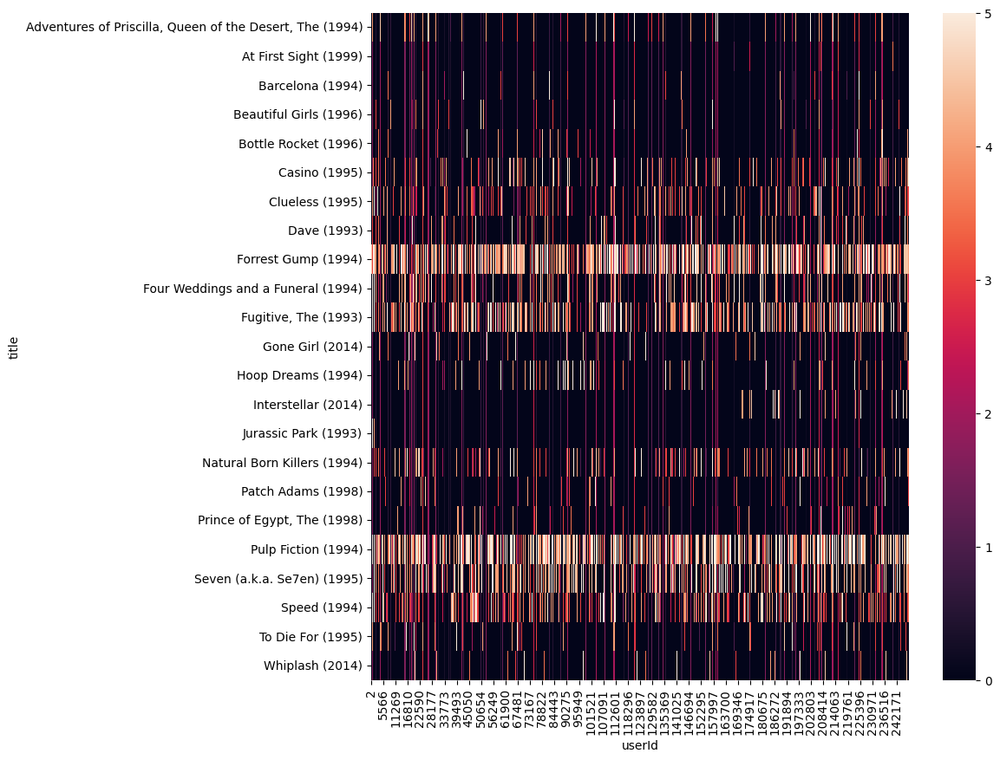

In [ ]:
plt.figure(figsize=(10,10))
heatmap_collab_filt = sns.heatmap(data=colab_table_test)

In [ ]:
ll = list(colab_table[2])
if(math.isnan(ll[0])):
  print(1)
# ll

1


In [ ]:
def movie_recom_collab(userId,n_recommendations,df_filled,df_nan):
  movies_by_user = list(df_nan[userId])
  ratings=[]
  movies=[]
  for i in range(len(movies_by_user)):
    if(math.isnan(movies_by_user[i])):
      # data = np.array(df_filled)
      # col_names = list(df_filled.columns)
      # data = np.column_stack((data, col_names))
      # ratings.append(data[i, np.where(data[-1, :] == userId)])

      userId_idx = list(df_filled.columns).index(userId)
      ratings.append(df_filled.iloc[i,userId_idx])
      movies.append(df_filled.index[i])

  sorted_idx = np.argsort(np.array(ratings))
  sorted_ratings = np.array(ratings)[sorted_idx]
  sorted_movies = np.array(movies)[sorted_idx]

  sorted_ratings = sorted_ratings[::-1]
  sorted_movies = sorted_movies[::-1]

  print("The top recommendations are:-")
  for i in range(n_recommendations):
    print(str(i+1)+"."+str(sorted_movies[i]))
  return(sorted_movies[:n_recommendations])






In [ ]:
recommendations_for_user = movie_recom_collab(15,5,colab_table_test,colab_table)

The top recommendations are:-
1.Whiplash (2014)
2.To Die For (1995)
3.Prince of Egypt, The (1998)
4.Patch Adams (1998)
5.Natural Born Killers (1994)


# Clustering

In [ ]:
# Importing necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.sparse import csr_matrix
from mpl_toolkits.axes_grid1 import make_axes_locatable
from sklearn.cluster import KMeans
from sklearn.metrics import mean_squared_error
import itertools
from sklearn.metrics import silhouette_samples, silhouette_score

In [ ]:
movies = df_movies.copy(deep=True)
ratings = df_ratings.copy(deep=True)[5000000:5000000+100000]

318     361
296     346
356     342
593     329
480     283
       ... 
6852      1
6992      1
7042      1
7095      1
860       1
Name: movieId, Length: 8794, dtype: int64

In [ ]:
#Creating a function for getting genre rating for every genre in our dataset 
def get_genre_ratings(ratings, movies, genres, column_names):
    genre_ratings = pd.DataFrame()
    for genre in genres:        
        genre_movies = movies[movies['genres'].str.contains(genre) ]
        avg_genre_votes_per_user = ratings[ratings['movieId'].isin(genre_movies['movieId'])].loc[:, ['userId', 'rating']].groupby(['userId'])['rating'].mean().round(2)
        
        genre_ratings = pd.concat([genre_ratings, avg_genre_votes_per_user], axis=1)
        
    genre_ratings.columns = column_names
    return genre_ratings

In [ ]:
genre_ratings = get_genre_ratings(ratings, movies, ['Romance', 'Sci-Fi'], ['avg_romance_rating', 'avg_scifi_rating'])
genre_ratings.head()

,avg_romance_rating,avg_scifi_rating
53592,2.75,3.10
53593,3.50,2.67
53594,3.29,3.00
53595,3.79,3.51
53597,4.15,4.07


In [ ]:
biased_dataset = genre_ratings
print( "Number of records: ", len(biased_dataset))
biased_dataset.head()

Number of records:  302


,index,avg_romance_rating,avg_scifi_rating
0,53592,2.75,3.10
1,53593,3.50,2.67
2,53594,3.29,3.00
3,53599,4.20,2.50
4,53602,2.98,2.56


In [ ]:
def draw_scatterplot(x_data, x_label, y_data, y_label):
    fig = plt.figure(figsize=(8,8))
    ax = fig.add_subplot(111)
    plt.xlim(0, 5)
    plt.ylim(0, 5)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.scatter(x_data, y_data, s=30)
# Plot the scatterplot
# draw_scatterplot(biased_dataset['avg_scifi_rating'],'Avg scifi rating', biased_dataset['avg_romance_rating'], 'Avg romance rating')

In [ ]:
biased_dataset.fillna(0,inplace=True)
biased_dataset

,index,avg_romance_rating,avg_scifi_rating
0,53592,2.75,3.10
1,53593,3.50,2.67
2,53594,3.29,3.00
3,53599,4.20,2.50
4,53602,2.98,2.56
...,...,...,...
297,54638,2.64,3.23
298,54639,2.73,3.04
299,54645,2.75,3.50
300,53592,2.75,3.10


In [ ]:
#Creating a pivot table with userId's on x axis and movies on yaxis 
# This pivot table will help us in doing clustering 
ratings_title = pd.merge(ratings, movies[['movieId', 'title']], on='movieId' )
user_movie_ratings = pd.pivot_table(ratings_title, index='userId', columns= 'title', values='rating')
# Print he number of dimensions and a subset of the dataset
print('dataset dimensions: ', user_movie_ratings.shape, '\n\nSubset example:')
user_movie_ratings

dataset dimensions:  (1074, 8793) 

Subset example:


title,"""Great Performances"" Cats (1998)",'71 (2014),'Til There Was You (1997),"'burbs, The (1989)",'night Mother (1986),(500) Days of Summer (2009),(Untitled) (2009),*batteries not included (1987),...And Justice for All (1979),1-900 (06) (1994),...,Zorba the Greek (Alexis Zorbas) (1964),"Zorro, the Gay Blade (1981)",Zulu (1964),Zulu (2013),[REC] (2007),[REC]² (2009),eXistenZ (1999),xXx (2002),xXx: State of the Union (2005),¡Three Amigos! (1986)
userId,,,,,,,,,,,,,,,,,,,,,
53592,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
53593,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
53594,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
53595,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
53596,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54661,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0
54662,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
54663,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
def get_most_rated_movies(user_movie_ratings, max_number_of_movies):
    
    user_movie_ratings = user_movie_ratings.append(user_movie_ratings.count(), ignore_index=True)
    user_movie_ratings_sorted = user_movie_ratings.sort_values(len(user_movie_ratings)-1, axis=1, ascending=False)
    user_movie_ratings_sorted = user_movie_ratings_sorted.drop(user_movie_ratings_sorted.tail(1).index)
    most_rated_movies = user_movie_ratings_sorted.iloc[:, :max_number_of_movies]
    return most_rated_movies

user_movie_ratings =  pd.pivot_table(ratings_title, index='userId', columns= 'title', values='rating')
most_rated_movies_1k = get_most_rated_movies(user_movie_ratings, 1000)
most_rated_movies_1k

<ipython-input-42-104b4b63b92e>:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  user_movie_ratings = user_movie_ratings.append(user_movie_ratings.count(), ignore_index=True)


title,"Shawshank Redemption, The (1994)",Pulp Fiction (1994),Forrest Gump (1994),"Silence of the Lambs, The (1991)",Jurassic Park (1993),"Matrix, The (1999)",Braveheart (1995),Star Wars: Episode IV - A New Hope (1977),Toy Story (1995),Star Wars: Episode VI - Return of the Jedi (1983),...,Rocky III (1982),"Cider House Rules, The (1999)",Secrets & Lies (1996),"Notebook, The (2004)",Despicable Me (2010),Midnight in the Garden of Good and Evil (1997),Christmas Vacation (National Lampoon's Christmas Vacation) (1989),Titan A.E. (2000),Before Sunrise (1995),Indiana Jones and the Kingdom of the Crystal Skull (2008)
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5.0,NaN,NaN,5.0,4.0,4.0,5.0,3.0,5.0,4.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1069,NaN,2.0,5.0,4.0,3.0,5.0,5.0,5.0,5.0,5.0,...,NaN,NaN,NaN,NaN,NaN,NaN,4.0,4.0,NaN,NaN
1070,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1071,5.0,3.0,5.0,5.0,3.0,3.0,4.5,2.0,3.5,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1072,4.0,3.0,3.0,3.0,NaN,NaN,NaN,NaN,3.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# sparse_ratings = csr_matrix(pd.SparseDataFrame(most_rated_movies_1k).to_coo())

In [ ]:
filled_dataset = most_rated_movies_1k.fillna(0)

In [ ]:
def draw_movies_heatmap(most_rated_movies_users_selection, axis_labels=True):
    
    fig = plt.figure(figsize=(15,4))
    ax = plt.gca()
    
    # Draw heatmap
    heatmap = ax.imshow(most_rated_movies_users_selection,  interpolation='nearest', vmin=0, vmax=5, aspect='auto')
    if axis_labels:
        ax.set_yticks(np.arange(most_rated_movies_users_selection.shape[0]) , minor=False)
        ax.set_xticks(np.arange(most_rated_movies_users_selection.shape[1]) , minor=False)
        ax.invert_yaxis()
        ax.xaxis.tick_top()
        labels = most_rated_movies_users_selection.columns.str[:40]
        ax.set_xticklabels(labels, minor=False)
        ax.set_yticklabels(most_rated_movies_users_selection.index, minor=False)
        plt.setp(ax.get_xticklabels(), rotation=90)
    else:
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    
    ax.grid(False)
    ax.set_ylabel('User id')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = fig.colorbar(heatmap, ticks=[5, 4, 3, 2, 1, 0], cax=cax)
    cbar.ax.set_yticklabels(['5 stars', '4 stars','3 stars','2 stars','1 stars','0 stars'])
    plt.show()  

In [ ]:
#Creating clusters for every genre , and then visualizing clusters as well as  predicting further movies
predictions = KMeans(n_clusters=20, algorithm='full').fit_predict(filled_dataset)
max_users = 70
max_movies = 50
clustered = pd.concat([most_rated_movies_1k.reset_index(), pd.DataFrame({'group':predictions})], axis=1)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1366: FutureWarning: algorithm='full' is deprecated, it will be removed in 1.3. Using 'lloyd' instead.
  warnings.warn(


In [ ]:
clustered

,index,"Shawshank Redemption, The (1994)",Pulp Fiction (1994),Forrest Gump (1994),"Silence of the Lambs, The (1991)",Jurassic Park (1993),"Matrix, The (1999)",Braveheart (1995),Star Wars: Episode IV - A New Hope (1977),Toy Story (1995),...,"Cider House Rules, The (1999)",Secrets & Lies (1996),"Notebook, The (2004)",Despicable Me (2010),Midnight in the Garden of Good and Evil (1997),Christmas Vacation (National Lampoon's Christmas Vacation) (1989),Titan A.E. (2000),Before Sunrise (1995),Indiana Jones and the Kingdom of the Crystal Skull (2008),group
0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
3,3,5.0,NaN,NaN,5.0,4.0,4.0,5.0,3.0,5.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7
4,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1069,1069,NaN,2.0,5.0,4.0,3.0,5.0,5.0,5.0,5.0,...,NaN,NaN,NaN,NaN,NaN,4.0,4.0,NaN,NaN,7
1070,1070,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
1071,1071,5.0,3.0,5.0,5.0,3.0,3.0,4.5,2.0,3.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11
1072,1072,4.0,3.0,3.0,3.0,NaN,NaN,NaN,NaN,3.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


<ipython-input-42-104b4b63b92e>:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  user_movie_ratings = user_movie_ratings.append(user_movie_ratings.count(), ignore_index=True)


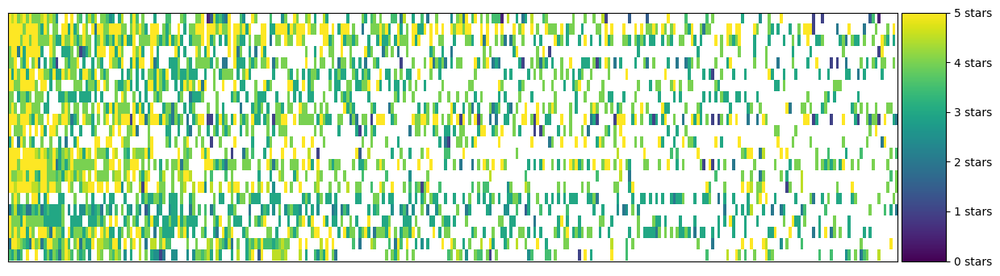

In [ ]:
def sort_by_rating_density(user_movie_ratings, n_movies, n_users):
    most_rated_movies = get_most_rated_movies(user_movie_ratings, n_movies)
    # most_rated_movies = get_users_who_rate_the_most(most_rated_movies, n_users)
    return most_rated_movies
cluster_number = 11
n_users = 75
n_movies = 300
cluster = clustered[clustered.group == cluster_number].drop(['index', 'group'], axis=1)
cluster = sort_by_rating_density(cluster, n_movies, n_users)
draw_movies_heatmap(cluster, axis_labels=False)

In [ ]:
cluster.fillna('').head()

,Star Wars: Episode IV - A New Hope (1977),"Silence of the Lambs, The (1991)","Shawshank Redemption, The (1994)",Back to the Future (1985),"Fugitive, The (1993)",Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981),Pulp Fiction (1994),Star Wars: Episode V - The Empire Strikes Back (1980),Forrest Gump (1994),Fargo (1996),...,"Lost World: Jurassic Park, The (1997)",Secrets & Lies (1996),Swingers (1996),Fear and Loathing in Las Vegas (1998),"Right Stuff, The (1983)",Sunset Blvd. (a.k.a. Sunset Boulevard) (1950),True Romance (1993),Gladiator (2000),Searching for Bobby Fischer (1993),Austin Powers: The Spy Who Shagged Me (1999)
0,5.0,4.5,5.0,4.0,4.5,5.0,4.0,5.0,4.0,4.0,...,1.5,3.5,,0.5,,,,,,
1,5.0,5.0,5.0,5.0,5.0,4.0,5.0,5.0,5.0,5.0,...,,,4.0,,,,4.0,,5.0,
2,5.0,5.0,5.0,5.0,4.0,5.0,5.0,4.0,5.0,5.0,...,,4.0,,,5.0,4.0,3.0,,3.0,
3,4.0,5.0,5.0,2.0,5.0,3.0,5.0,5.0,5.0,5.0,...,,,,1.0,5.0,,,,,
4,4.0,4.0,5.0,,4.0,3.0,5.0,,4.0,5.0,...,,4.0,3.0,,4.0,4.0,,,4.0,


In [ ]:
cluster.iloc[19]


Star Wars: Episode IV - A New Hope (1977)        5.0
Silence of the Lambs, The (1991)                 4.0
Shawshank Redemption, The (1994)                 5.0
Back to the Future (1985)                        4.0
Fugitive, The (1993)                             5.0
                                                ... 
Sunset Blvd. (a.k.a. Sunset Boulevard) (1950)    NaN
True Romance (1993)                              NaN
Gladiator (2000)                                 NaN
Searching for Bobby Fischer (1993)               NaN
Austin Powers: The Spy Who Shagged Me (1999)     NaN
Name: 19, Length: 300, dtype: float64

In [ ]:
cluster.iloc[15]

Star Wars: Episode IV - A New Hope (1977)        5.0
Silence of the Lambs, The (1991)                 5.0
Shawshank Redemption, The (1994)                 4.5
Back to the Future (1985)                        5.0
Fugitive, The (1993)                             5.0
                                                ... 
Sunset Blvd. (a.k.a. Sunset Boulevard) (1950)    NaN
True Romance (1993)                              4.0
Gladiator (2000)                                 NaN
Searching for Bobby Fischer (1993)               NaN
Austin Powers: The Spy Who Shagged Me (1999)     4.0
Name: 15, Length: 300, dtype: float64

In [ ]:
#Predicting movies from the clusters we created before 
user_id = 15
user_2_ratings  = cluster.loc[user_id, :]
user_2_unrated_movies =  user_2_ratings[user_2_ratings.isnull()]
avg_ratings = pd.concat([user_2_unrated_movies, cluster.mean()], axis=1, join='inner').loc[:,0]
avg_ratings.sort_values(ascending=False)[:20]

Usual Suspects, The (1995)                                                     4.821429
Schindler's List (1993)                                                        4.607143
Killing Fields, The (1984)                                                     4.571429
Deer Hunter, The (1978)                                                        4.500000
Strictly Ballroom (1992)                                                       4.500000
Maltese Falcon, The (1941)                                                     4.428571
As Good as It Gets (1997)                                                      4.428571
Chasing Amy (1997)                                                             4.416667
Big Lebowski, The (1998)                                                       4.416667
Sting, The (1973)                                                              4.400000
Shallow Grave (1994)                                                           4.400000
Dr. Strangelove or: How I Learne